# 1. Mount the Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 2. Load Module

In [ ]:
import os
import glob
import cv2
import numpy as np
from keras import Model, optimizers
# from keras.layers import Dense, GlobalAveragePooling2D, Dropout
from keras.preprocessing.image import ImageDataGenerator
from sklearn import preprocessing
from tensorflow.keras.optimizers import Adam, Adadelta, Adagrad, RMSprop, SGD
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Activation, Input, ZeroPadding2D, GlobalAveragePooling2D, BatchNormalization
from sklearn.model_selection import train_test_split
import h5py
import matplotlib.pyplot as plt
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau

#DenseNET
from keras.applications.densenet import DenseNet121
from keras.applications.densenet import preprocess_input

#VGG16
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input

#Resnet50V2
from keras.applications.resnet_v2 import ResNet50V2
from keras.applications.resnet_v2 import preprocess_input

#MobileNet
from keras.applications.mobilenet import MobileNet
from keras.applications.mobilenet import preprocess_input

# Augmentation

In [ ]:
IMAGE_SIZE = 256
BATCH_SIZE = 1000
LABELS = ['Healthy','Bacterial']

for label in LABELS:
# Generates batches of image data with data augmentation
  datagen = ImageDataGenerator(rotation_range=360, # Degree range for random rotations
                          width_shift_range=0.2, # Range for random horizontal shifts
                          height_shift_range=0.2, # Range for random vertical shifts
                          zoom_range=0.2, # Range for random zoom
                          horizontal_flip=True, # Randomly flip inputs horizontally
                          vertical_flip=True) # Randomly flip inputs vertically

  # datagen.fit(x_train)
  train_generator = datagen.flow_from_directory(
        '/content/drive/MyDrive/Kaggle2/Pepperbell_New/', shuffle=True, save_to_dir='/content/drive/MyDrive/Kaggle2/Pepperbell_New/'+label, target_size=(IMAGE_SIZE,IMAGE_SIZE), save_prefix='N', classes=[label], class_mode='binary', save_format='JPG',batch_size=BATCH_SIZE)

  # Following line triggers execution of train_generator
  batch = next(train_generator)

Found 1994 images belonging to 1 classes.


In [ ]:
import os

dir_healthy = '/content/drive/MyDrive/Kaggle2/Pepperbell_New/Healthy'
dir_bacterial = '/content/drive/MyDrive/Kaggle2/Pepperbell_New/Bacterial'
list_healthy = os.listdir(dir_healthy) # dir is your directory path
list_bacterial = os.listdir(dir_bacterial) # dir is your directory path
total_healthy = len(list_healthy)
total_bacterial = len(list_bacterial)
total = total_healthy + total_bacterial
print("Total Kelas Healthy : ", total_healthy)
print("Total Kelas Bacterial : ", total_bacterial)
print("Total Keselutuhan : ", total)

Total Kelas Healthy :  2478
Total Kelas Bacterial :  1997
Total Keselutuhan :  4475


# 3. Make the Model Dataset

In [ ]:
paperbell_train = "/content/drive/MyDrive/Kaggle2/Pepperbell_New"

labels=os.listdir(paperbell_train)
labels.sort()
print('Kelas : ', labels)

le = preprocessing.LabelEncoder()
le.fit(labels)

X = []
y = []

for label in labels:
  dir=os.path.join(paperbell_train, label)

  for file in glob.glob(dir + "/*"):
      im = cv2.imread(file)
      im = cv2.resize(im,(32,32),interpolation=cv2.INTER_AREA)
      im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
      X.append(im)
      y.append(label)
  print("[Status] Load dataset telah selesai pada folder : {}".format(label))
print("[Status] Load dataset telah selesai pada semua folder")

# X = np.array(X)
# y = np.array(le.transform(y))

Kelas :  ['Bacterial', 'Healthy']
[Status] Load dataset telah selesai pada folder : Bacterial
[Status] Load dataset telah selesai pada folder : Healthy
[Status] Load dataset telah selesai pada semua folder


# 4. Save the Model Dataset

In [ ]:
# labels=os.listdir(rice_train)
# labels.sort()

images = np.array(X)
# le = preprocessing.LabelEncoder()
# le.fit(labels)
labels = np.array(le.transform(y))

hdf5_dir = "/content/drive/MyDrive/Kaggle2/H5"
hdf5_file = "pepperbell_new_32x32.h5"

if not os.path.exists(hdf5_dir): os.makedirs(hdf5_dir)

# Create a new HDF5 file
file = h5py.File(hdf5_dir + "/" + hdf5_file, "w")

# Create a dataset in the file
dataset = file.create_dataset(
    "images", np.shape(images), h5py.h5t.STD_U8BE, data=images
)
meta_set = file.create_dataset(
    "meta", np.shape(labels), h5py.h5t.STD_U8BE, data=labels
)
file.close()

# 5. Load Dataset

In [ ]:
hdf5_dir = "/content/drive/MyDrive/Kaggle2/H5"
hdf5_file = "pepperbell_new_32x32.h5"

In [ ]:
def load_dataset(h5_file):
  file = h5py.File(h5_file, "r+")

  X = np.array(file["/images"]).astype("uint8")
  y = np.array(file["/meta"]).astype("uint8")

  (x_train, x_test, y_train, y_test) = train_test_split(X,y,test_size=0.1,random_state=42)
  # (x_train, x_test, y_train, y_test) = train_test_split(X,y,test_size=0.1,random_state=101)

  return (x_train, y_train), (x_test, y_test)

# 6. Split the Train & Test

In [ ]:
from sklearn.model_selection import train_test_split

# load the pre-shuffled train and test data

(x_train, y_train), (x_test, y_test) = load_dataset(hdf5_dir+'/'+hdf5_file)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(4027, 32, 32, 3)
(4027,)
(448, 32, 32, 3)
(448,)


# 7. Visualize the Random 36 Training Images

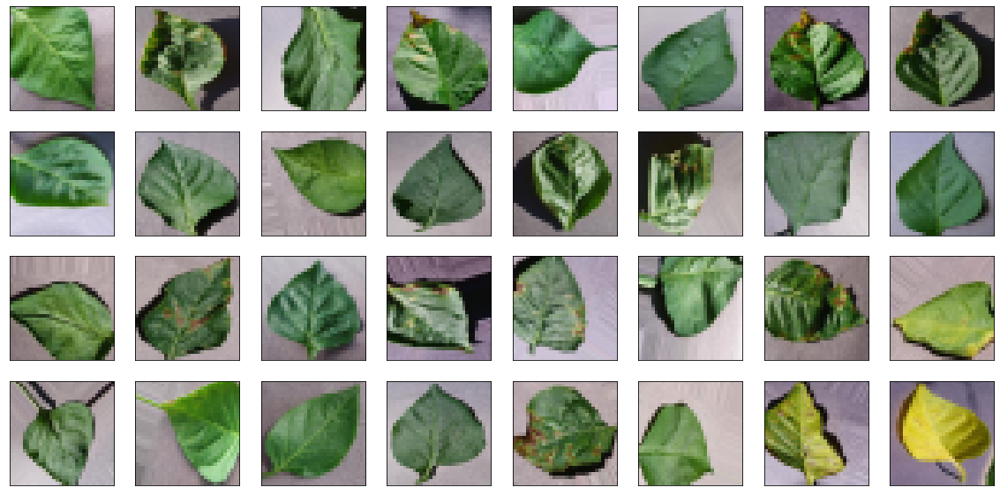

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

fig = plt.figure(figsize=(20,10))
for i in range(32):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_train[i]))

# 8. Rescale the Images by Dividing Every Pixel in Every Image by 255
In fact, the cost function has the shape of a bowl, but it can be an elongated bowl if the features have very
different scales. Figure below shows Gradient Descent on a training set where features 1 and 2 have the
same scale (on the left), and on a training set where feature 1 has much smaller values than feature 2 (on
the right).

** Tip: ** When using Gradient Descent, you should ensure that all features have a similar scale to speed up training or else it will take much longer to converge.

<!-- ![feature scaling](normalized.jpg) -->

In [ ]:
# rescale [0,255] --> [0,1]
x_train = x_train.astype('float32')/255
x_test = x_test.astype('float32')/255

# 9.  Break Dataset into Training, Testing, and Validation Sets

In [ ]:
import keras
import keras.utils
# from keras import utils as np_utils
from keras.utils.np_utils import to_categorical

# one-hot encode the labels
num_classes = len(np.unique(y_train))
y_train = to_categorical(y_train, num_classes)
y_test = to_categorical(y_test, num_classes)
# y_train = keras.utils.np_utils(y_train, num_classes)
# y_test = keras.utils(y_test, num_classes)

# break training set into training and validation sets
(x_train, x_valid) = x_train[448:], x_train[:448]
(y_train, y_valid) = y_train[448:], y_train[:448]

# print shape of training set
print('x_train shape:', x_train.shape)

# print number of training, validation, and test images
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')
print(x_valid.shape[0], 'validation samples')

x_train shape: (3579, 32, 32, 3)
3579 train samples
448 test samples
448 validation samples


# 10. Build the Classification Model

In this case, we build the classification model with the architecture DenseNet121

### Model 1

#### Model Architecture

In [ ]:
model1 = DenseNet121(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

x = model1.output

x = GlobalAveragePooling2D()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#predict
predictions = Dense(2, activation='sigmoid')(x)

# model
model1 = Model(model1.input, predictions)

model1.summary()

Model: "model_25"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_26 (InputLayer)           [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d_38 (ZeroPadding2 (None, 38, 38, 3)    0           input_26[0][0]                   
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 16, 16, 64)   9408        zero_padding2d_38[0][0]          
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1/conv[0][0]                 
___________________________________________________________________________________________

#### Compile the Model

In [ ]:
optimizer = RMSprop(lr=0.0001)
model1.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


#### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='/content/drive/MyDrive/Kaggle2/HDF5/NEW/model1.weights.best.hdf5', verbose=1, save_best_only=True)

hist = model1.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 126s - loss: 0.3800 - accuracy: 0.8502 - val_loss: 0.5441 - val_accuracy: 0.6964

Epoch 00001: val_loss improved from inf to 0.54405, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_rmsprop.weights.best.hdf5
Epoch 2/20
112/112 - 72s - loss: 0.1190 - accuracy: 0.9589 - val_loss: 0.2396 - val_accuracy: 0.9129

Epoch 00002: val_loss improved from 0.54405 to 0.23958, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_rmsprop.weights.best.hdf5
Epoch 3/20
112/112 - 72s - loss: 0.0557 - accuracy: 0.9816 - val_loss: 0.1131 - val_accuracy: 0.9531

Epoch 00003: val_loss improved from 0.23958 to 0.11311, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_rmsprop.weights.best.hdf5
Epoch 4/20
112/112 - 72s - loss: 0.0312 - accuracy: 0.9902 - val_loss: 0.0475 - val_accuracy: 0.9844

Epoch 00004: val_loss improved from 0.11311 to 0.04753, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_rmsprop.weights.best.hdf5
Epoch 5/20
112/112 

In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

Waktu :  1565.2229793071747  atau :  00:26:05


#### History Loss & Accuracy

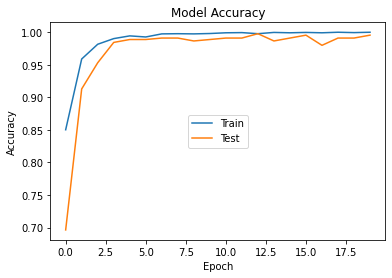

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

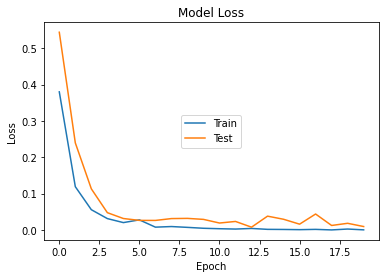

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

####  Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
model1 = load_model('/content/drive/MyDrive/Kaggle2/HDF5/NEW/model1.weights.best.hdf5')

In [ ]:
#2 load the weights that yielded the best validation accuracy
model1.load_weights('model1.weights.best.hdf5')

#### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = model1.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.9933035969734192


In [ ]:
# evaluate and print test accuracy
score = model1.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.9933035969734192


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = model1.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = model1.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 31s 125ms/step - loss: 0.0144 - accuracy: 0.9933
Final Loss: 0.014434651471674442, Final Accuracy: 0.9933035969734192
              precision    recall  f1-score   support

   Bacterial       0.99      1.00      0.99       212
     Healthy       1.00      0.99      0.99       236

    accuracy                           0.99       448
   macro avg       0.99      0.99      0.99       448
weighted avg       0.99      0.99      0.99       448



In [ ]:
# Kappa Statistic
from sklearn.metrics import cohen_kappa_score
result=cohen_kappa_score(y_true, y_pred)
print("Kappa statistic = {}".format(result))

Kappa statistic = 0.9865782535751378


#### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat = model1.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

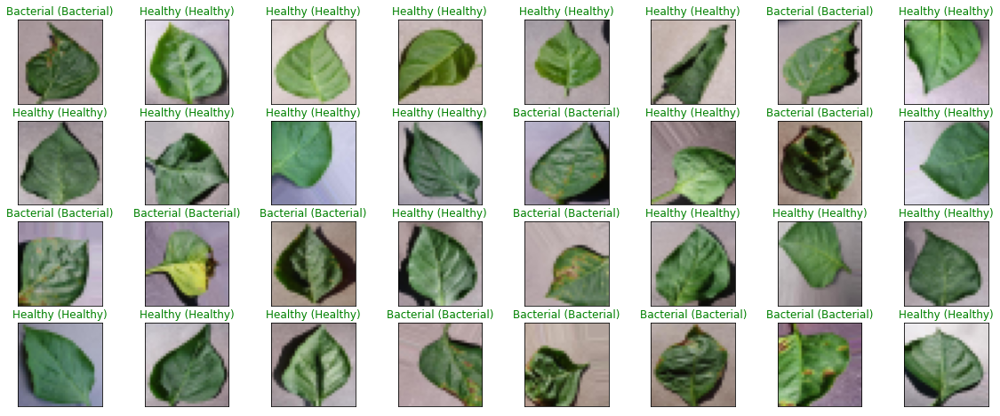

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

#### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat.argmax(axis=1))
print(matrix)

[[212   0]
 [  3 233]]


Text(0.5, 1.0, 'Confusion Matrix')

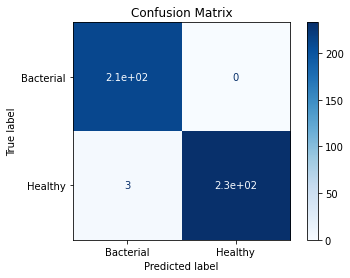

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Bacterial', 'Healthy'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

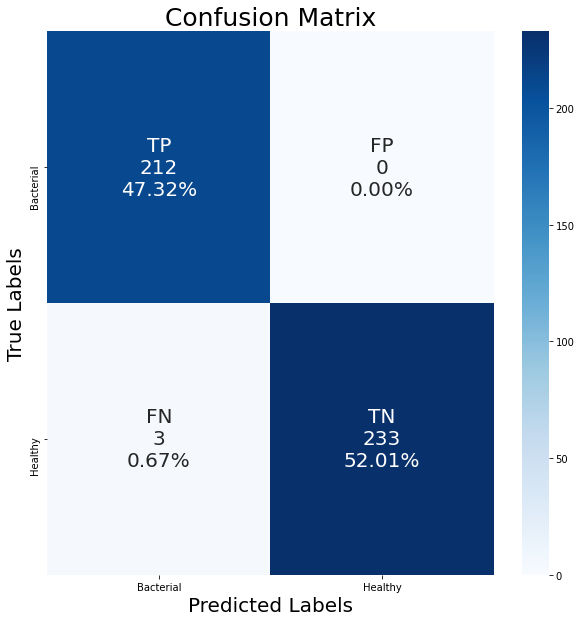

In [ ]:
import seaborn as sns

group_names = ['TP','FP','FN','TN']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)

## Model 2

### Model Architecture

In [ ]:
model2 = DenseNet121(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

x = model2.output

x= GlobalAveragePooling2D()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#layer 2
x= Dense(512,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#layer 3
# x= Dropout(0.3)(x)
predictions = Dense(2, activation='sigmoid')(x)


# model
model2 = Model(model2.input, predictions)

model2.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d_2 (ZeroPadding2D (None, 38, 38, 3)    0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 16, 16, 64)   9408        zero_padding2d_2[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1/conv[0][0]                 
____________________________________________________________________________________________

### Compile the Model

In [ ]:
print("X_train original shape", x_train.shape)
print("y_train original shape", y_train.shape)
print("X_valid original shape", x_valid.shape)
print("y_valid original shape", y_valid.shape)

X_train original shape (3579, 32, 32, 3)
y_train original shape (3579, 2)
X_valid original shape (448, 32, 32, 3)
y_valid original shape (448, 2)


In [ ]:
optimizer = RMSprop(lr=0.0001)
model2.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='/content/drive/MyDrive/Kaggle2/HDF5/NEW/model2.weights.best.hdf5', verbose=1, save_best_only=True)

hist = model2.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 127s - loss: 0.4520 - accuracy: 0.8142 - val_loss: 0.5543 - val_accuracy: 0.6964

Epoch 00001: val_loss improved from inf to 0.55434, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model2.weights.best.hdf5
Epoch 2/20
112/112 - 74s - loss: 0.1537 - accuracy: 0.9517 - val_loss: 0.2112 - val_accuracy: 0.9040

Epoch 00002: val_loss improved from 0.55434 to 0.21117, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model2.weights.best.hdf5
Epoch 3/20
112/112 - 74s - loss: 0.0710 - accuracy: 0.9782 - val_loss: 0.1343 - val_accuracy: 0.9442

Epoch 00003: val_loss improved from 0.21117 to 0.13435, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model2.weights.best.hdf5
Epoch 4/20
112/112 - 74s - loss: 0.0495 - accuracy: 0.9855 - val_loss: 0.1372 - val_accuracy: 0.9554

Epoch 00004: val_loss did not improve from 0.13435
Epoch 5/20
112/112 - 74s - loss: 0.0305 - accuracy: 0.9885 - val_loss: 0.0378 - val_accuracy: 0.9821

Epoch 00005: val_loss improved 

In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

Waktu :  1565.959484577179  atau :  00:26:05


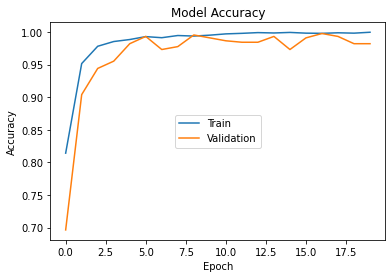

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='center')
plt.show()

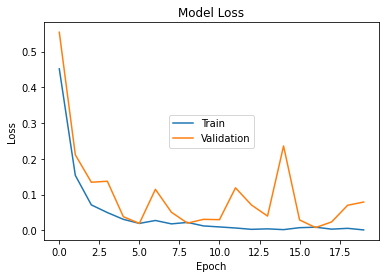

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='center')
plt.show()

### Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
model2 = load_model('/content/drive/MyDrive/Kaggle2/HDF5/NEW/model2.weights.best.hdf5')

In [ ]:
#2 load the weights that yielded the best validation accuracy
model2.load_weights('model2.weights.best.hdf5')

### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = model2.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.9888392686843872


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = model2.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = model2.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 2s 151ms/step - loss: 0.0258 - accuracy: 0.9888
Final Loss: 0.0257821436971426, Final Accuracy: 0.9888392686843872
              precision    recall  f1-score   support

   Bacterial       0.99      0.99      0.99       212
     Healthy       0.99      0.99      0.99       236

    accuracy                           0.99       448
   macro avg       0.99      0.99      0.99       448
weighted avg       0.99      0.99      0.99       448



### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat_model2 = model2.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

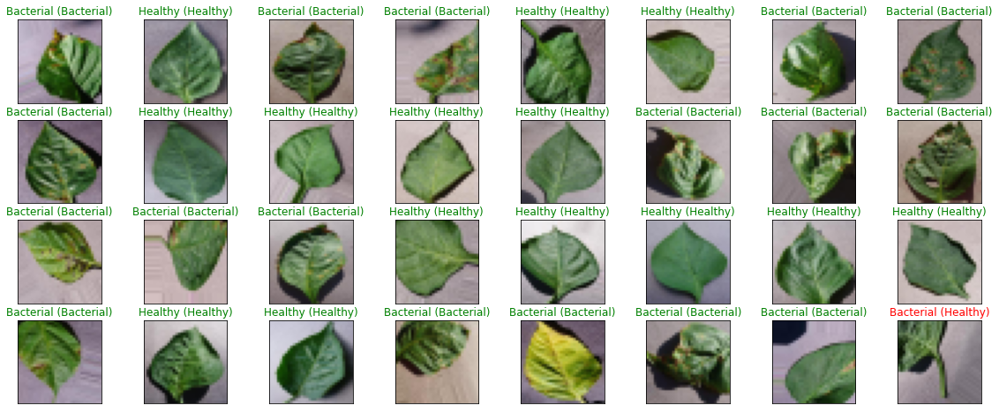

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat_model2[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat_model2.argmax(axis=1))
print(matrix)

[[210   2]
 [  3 233]]


Text(0.5, 1.0, 'Confusion Matrix')

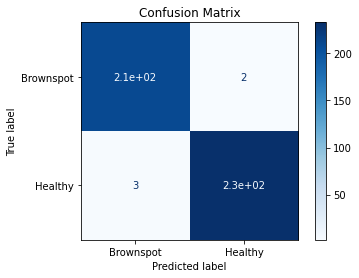

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Brownspot', 'Healthy', 'Hispa', 'leafBlast'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

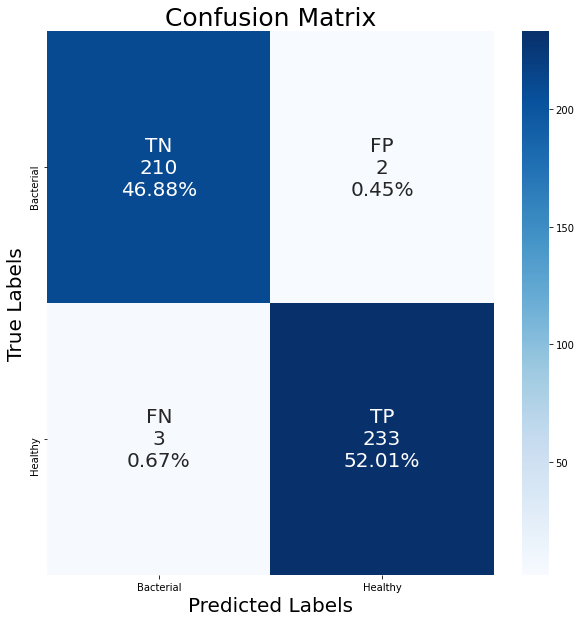

In [ ]:
import seaborn as sns

group_names = ['TN','FP','FN','TP']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)

## Model 3

### Model Architecture

In [ ]:
model3 = DenseNet121(weights='imagenet', include_top=False, input_shape=(32, 32, 3))
# for layer in model3.layers:
#     layer.trainable = False

x = model3.output

x= GlobalAveragePooling2D()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#layer 2
x= Dense(512,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#layer 3
x= Dense(256,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#predict
predictions = Dense(2, activation='sigmoid')(x)


# model
model3 = Model(model3.input, predictions)

model3.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d_6 (ZeroPadding2D (None, 38, 38, 3)    0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 16, 16, 64)   9408        zero_padding2d_6[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1/conv[0][0]                 
____________________________________________________________________________________________

### Compile the Model

In [ ]:
print("X_train original shape", x_train.shape)
print("y_train original shape", y_train.shape)
print("X_test original shape", x_test.shape)
print("y_test original shape", y_test.shape)

X_train original shape (3579, 32, 32, 3)
y_train original shape (3579, 2)
X_test original shape (448, 32, 32, 3)
y_test original shape (448, 2)


In [ ]:
model3.save('my_h5_model.png')

INFO:tensorflow:Assets written to: my_h5_model.png/assets


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.774579 to fit



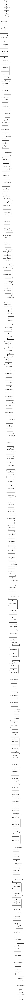

In [ ]:
from keras.utils import plot_model
plot_model(model3, to_file='model.png')

In [ ]:
optimizer = RMSprop(lr=0.0001)
model3.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='/content/drive/MyDrive/Kaggle2/HDF5/NEW/model3.weights.best.hdf5', verbose=1, save_best_only=True)

hist = model3.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 124s - loss: 0.6376 - accuracy: 0.7091 - val_loss: 0.4763 - val_accuracy: 0.8259

Epoch 00001: val_loss improved from inf to 0.47630, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model3.weights.best.hdf5
Epoch 2/20
112/112 - 72s - loss: 0.2831 - accuracy: 0.8975 - val_loss: 0.2393 - val_accuracy: 0.8996

Epoch 00002: val_loss improved from 0.47630 to 0.23925, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model3.weights.best.hdf5
Epoch 3/20
112/112 - 72s - loss: 0.1559 - accuracy: 0.9472 - val_loss: 0.1315 - val_accuracy: 0.9554

Epoch 00003: val_loss improved from 0.23925 to 0.13154, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model3.weights.best.hdf5
Epoch 4/20
112/112 - 73s - loss: 0.1023 - accuracy: 0.9659 - val_loss: 0.0737 - val_accuracy: 0.9621

Epoch 00004: val_loss improved from 0.13154 to 0.07374, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model3.weights.best.hdf5
Epoch 5/20
112/112 - 72s - loss: 0.0689 - accur

In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

Waktu :  1507.3487544059753  atau :  00:25:07


### History Loss & Accuracy

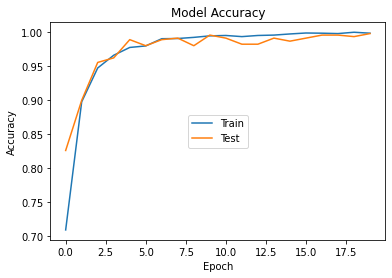

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

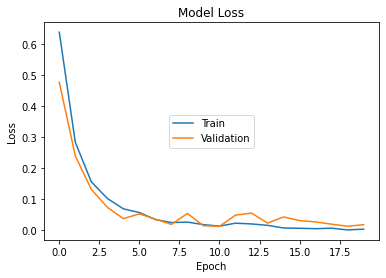

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='center')
plt.show()

### Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
model3 = load_model('/content/drive/MyDrive/Kaggle2/HDF5/NEW/model3.weights.best.hdf5')

In [ ]:
#2 load the weights that yielded the best validation accuracy
model3.load_weights('model3.weights.best.hdf5')

### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = model3.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.9866071343421936


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = model3.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = model3.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 2s 122ms/step - loss: 0.0626 - accuracy: 0.9866
Final Loss: 0.06256602704524994, Final Accuracy: 0.9866071343421936
              precision    recall  f1-score   support

   Bacterial       1.00      0.98      0.99       212
     Healthy       0.98      1.00      0.99       236

    accuracy                           0.99       448
   macro avg       0.99      0.99      0.99       448
weighted avg       0.99      0.99      0.99       448



### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat_model3 = model3.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

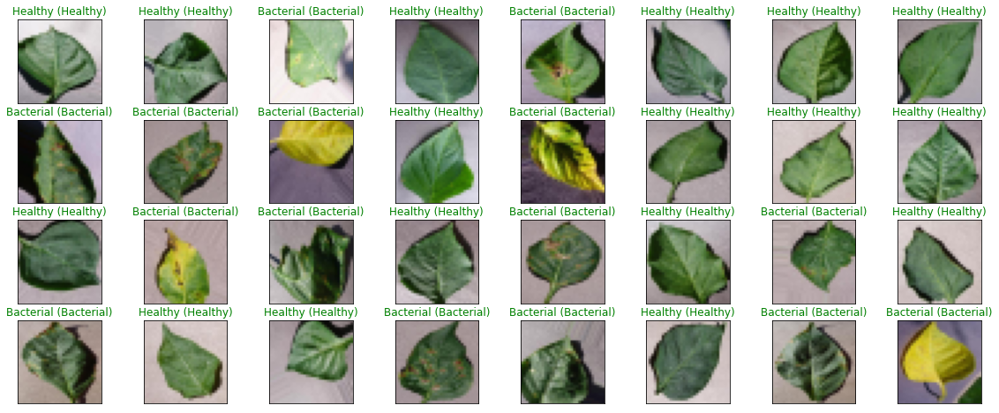

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat_model3[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat_model3.argmax(axis=1))
print(matrix)

[[207   5]
 [  1 235]]


Text(0.5, 1.0, 'Confusion Matrix')

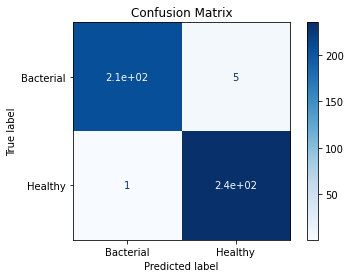

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Bacterial', 'Healthy'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

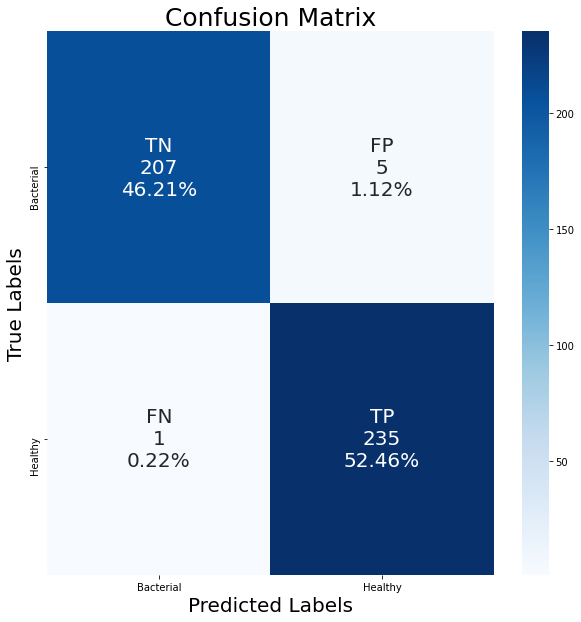

In [ ]:
import seaborn as sns

group_names = ['TN','FP','FN','TP']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)

### Predict An Image

In [ ]:
# Testing an Image
from PIL import Image
import numpy as np
from skimage import transform
def load(filename):
  np_image = Image.open(filename)
  np_image = np.array(np_image).astype('float32')/255
  np_image = transform.resize(np_image, (32, 32, 3))
  np_image = np.expand_dims(np_image, axis=0)
  return np_image

image = load('/content/drive/MyDrive/Kaggle2/paperbell/Healthy/01d03cb9-4505-458c-a6dc-648dedccd71a___JR_HL 8474.JPG')
labels = ['Bacterial','Healthy']
pred = densenet_base3.predict(image)
pred_label = labels[np.argmax(pred)]
pred_accuracy = pred[0][0] * 100

# print(pred)
print("Hasil prediksi dari gambar tersebut adalah : ", pred_label)
# print(pred_accuracy)

Hasil prediksi dari gambar tersebut adalah :  Healthy


## 11. Transfer Learning Architecture

### DenseNet 121

#### Model Architecture

In [ ]:
densenet_base = DenseNet121(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

x = densenet_base.output

x = GlobalAveragePooling2D()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#predict
predictions = Dense(2, activation='sigmoid')(x)

# model
densenet_base = Model(densenet_base.input, predictions)

densenet_base.summary()

Model: "model_21"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_22 (InputLayer)           [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d_30 (ZeroPadding2 (None, 38, 38, 3)    0           input_22[0][0]                   
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 16, 16, 64)   9408        zero_padding2d_30[0][0]          
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1/conv[0][0]                 
___________________________________________________________________________________________

#### Compile the Model

In [ ]:
optimizer = Adam(lr=0.0001)
densenet_base.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


#### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='model_densenet.weights.best.hdf5', verbose=1, save_best_only=True)

hist = densenet.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 125s - loss: 0.4367 - accuracy: 0.8245 - val_loss: 0.4699 - val_accuracy: 0.7455

Epoch 00001: val_loss improved from inf to 0.46989, saving model to model1.weights.best.hdf5
Epoch 2/20
112/112 - 74s - loss: 0.1460 - accuracy: 0.9539 - val_loss: 0.1992 - val_accuracy: 0.9353

Epoch 00002: val_loss improved from 0.46989 to 0.19917, saving model to model1.weights.best.hdf5
Epoch 3/20
112/112 - 72s - loss: 0.0655 - accuracy: 0.9799 - val_loss: 0.0775 - val_accuracy: 0.9754

Epoch 00003: val_loss improved from 0.19917 to 0.07754, saving model to model1.weights.best.hdf5
Epoch 4/20
112/112 - 73s - loss: 0.0388 - accuracy: 0.9874 - val_loss: 0.0827 - val_accuracy: 0.9777

Epoch 00004: val_loss did not improve from 0.07754
Epoch 5/20
112/112 - 73s - loss: 0.0303 - accuracy: 0.9905 - val_loss: 0.0490 - val_accuracy: 0.9888

Epoch 00005: val_loss improved from 0.07754 to 0.04900, saving model to model1.weights.best.hdf5
Epoch 6/20
112/112 - 73s - loss: 0.0205 - accuracy: 0.

In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

Waktu :  1560.7258441448212  atau :  00:26:00


#### History Loss & Accuracy

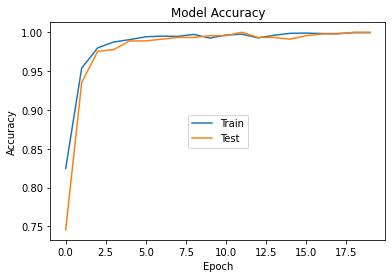

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

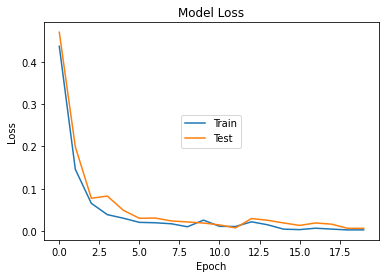

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

####  Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
densenet_base = load_model('/content/model_densenet.weights.best.hdf5')

In [ ]:
#2 load the weights that yielded the best validation accuracy
densenet_base.load_weights('model_densenet.weights.best.hdf5')

#### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = densenet_base.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.9888392686843872


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = densenet_base.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = model1.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 2s 126ms/step - loss: 0.0351 - accuracy: 0.9888
Final Loss: 0.035058021545410156, Final Accuracy: 0.9888392686843872
              precision    recall  f1-score   support

   Bacterial       1.00      0.98      0.99       212
     Healthy       0.98      1.00      0.99       236

    accuracy                           0.99       448
   macro avg       0.99      0.99      0.99       448
weighted avg       0.99      0.99      0.99       448



#### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat = densenet_base.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

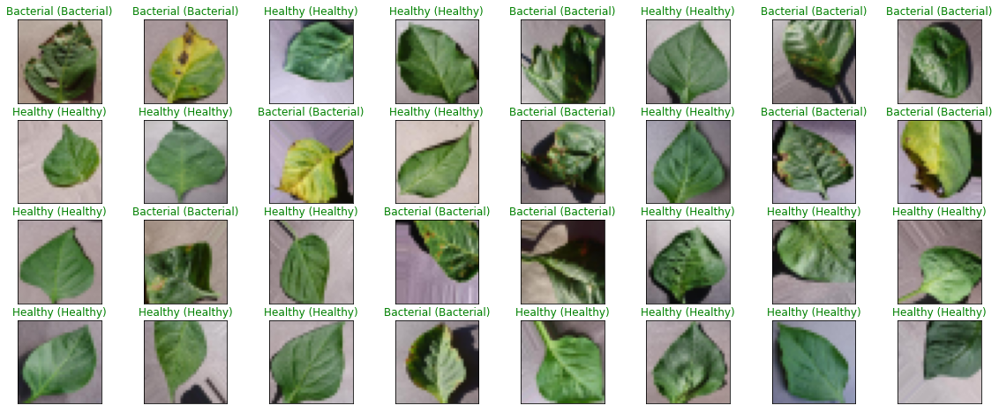

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

#### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat.argmax(axis=1))
print(matrix)

[[207   5]
 [  0 236]]


Text(0.5, 1.0, 'Confusion Matrix')

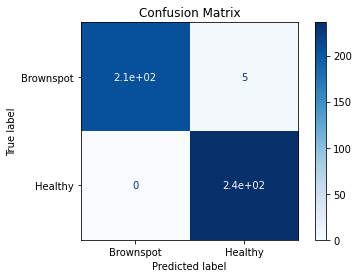

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Bacterial', 'Healthy'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

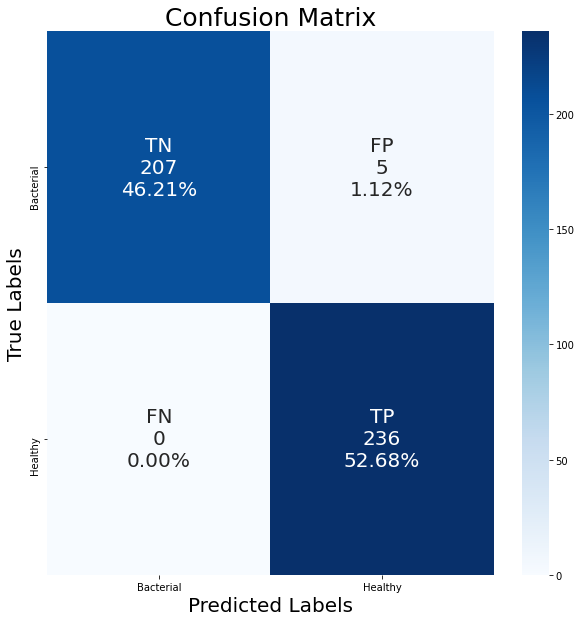

In [ ]:
import seaborn as sns

group_names = ['TN','FP','FN','TP']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)

### VGG16

#### Model Architecture

In [ ]:
vgg_base = VGG16(include_top=False, weights='imagenet', input_shape=(32,32,3))

x = vgg_base.output

x = GlobalAveragePooling2D()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#predict
predictions = Dense(2, activation='sigmoid')(x)

# model
vgg_base = Model(vgg_base.input, predictions)

vgg_base.summary()

58900480/58889256 [==============================] - 0s 0us/step
Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 32, 32, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 32, 32, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 16, 16, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 16, 16, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 16, 16, 128)       147584    
____________________________________________________________

#### Compile the Model

In [ ]:
print("X_train original shape", x_train.shape)
print("y_train original shape", y_train.shape)
print("X_test original shape", x_test.shape)
print("y_test original shape", y_test.shape)

X_train original shape (3579, 32, 32, 3)
y_train original shape (3579, 2)
X_test original shape (448, 32, 32, 3)
y_test original shape (448, 2)


In [ ]:
optimizer = RMSprop(lr=0.0001)
vgg_base.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


#### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_vgg16.weights.best.hdf5', verbose=1, save_best_only=True)

hist = vgg_base.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 357s - loss: 0.2716 - accuracy: 0.8854 - val_loss: 0.3177 - val_accuracy: 0.8504

Epoch 00001: val_loss improved from inf to 0.31770, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_vgg16.weights.best.hdf5
Epoch 2/20
112/112 - 359s - loss: 0.1248 - accuracy: 0.9550 - val_loss: 2.8443 - val_accuracy: 0.4598

Epoch 00002: val_loss did not improve from 0.31770
Epoch 3/20
112/112 - 359s - loss: 0.1007 - accuracy: 0.9668 - val_loss: 4.6710 - val_accuracy: 0.5513

Epoch 00003: val_loss did not improve from 0.31770
Epoch 4/20
112/112 - 361s - loss: 0.0846 - accuracy: 0.9760 - val_loss: 0.1054 - val_accuracy: 0.9643

Epoch 00004: val_loss improved from 0.31770 to 0.10539, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_vgg16.weights.best.hdf5
Epoch 5/20
112/112 - 356s - loss: 0.0503 - accuracy: 0.9841 - val_loss: 6.4981 - val_accuracy: 0.4621

Epoch 00005: val_loss did not improve from 0.10539
Epoch 6/20
112/112 - 353s - loss: 0.0398 - accuracy:

In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

Waktu :  7284.913384437561  atau :  02:01:24


#### History Loss & Accuracy

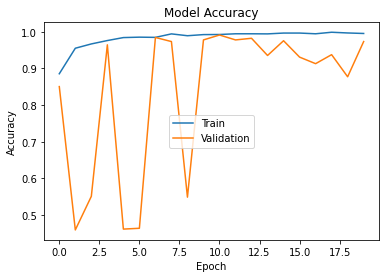

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='center')
plt.show()

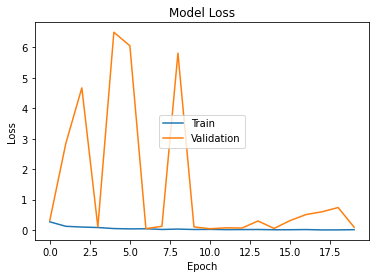

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='center')
plt.show()

#### Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
vgg_base = load_model('/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_vgg16.weights.best.hdf5')

In [ ]:
#2 load the weights that yielded the best validation accuracy
vgg_base.load_weights('model_vgg16.weights.best.hdf5')

#### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = vgg_base.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.9888392686843872


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = vgg_base.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = vgg_base.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 5s 354ms/step - loss: 0.0539 - accuracy: 0.9888
Final Loss: 0.05387962609529495, Final Accuracy: 0.9888392686843872
              precision    recall  f1-score   support

   Bacterial       0.99      0.99      0.99       212
     Healthy       0.99      0.99      0.99       236

    accuracy                           0.99       448
   macro avg       0.99      0.99      0.99       448
weighted avg       0.99      0.99      0.99       448



#### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat_vgg_base = vgg_base.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

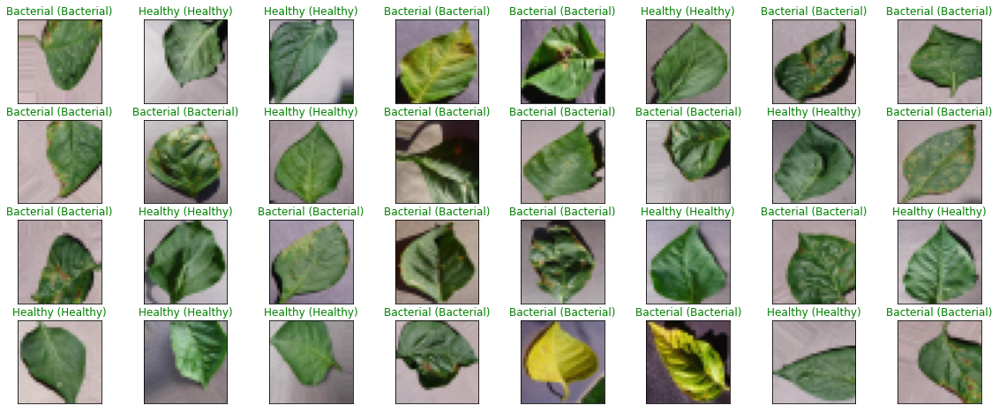

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat_vgg_base[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

#### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat_vgg_base.argmax(axis=1))
print(matrix)

[[210   2]
 [  3 233]]


Text(0.5, 1.0, 'Confusion Matrix')

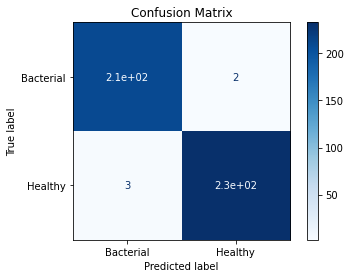

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Bacterial', 'Healthy'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

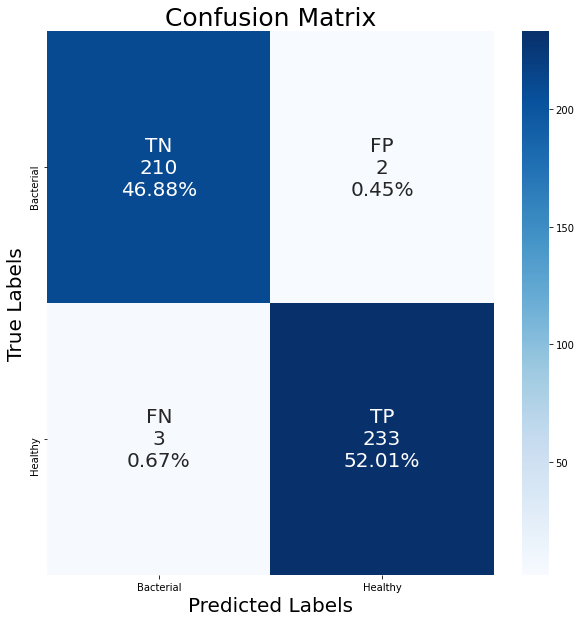

In [ ]:
import seaborn as sns

group_names = ['TN','FP','FN','TP']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)

### ResNet50V2

#### Model Architecture

In [ ]:
resnet_base = ResNet50V2(include_top=False, weights='imagenet', input_shape=(32,32,3))

x = resnet_base.output

x = GlobalAveragePooling2D()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#predict
predictions = Dense(2, activation='sigmoid')(x)

# model
resnet_base = Model(resnet_base.input, predictions)

resnet_base.summary()

94683136/94668760 [==============================] - 1s 0us/step
Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 38, 38, 3)    0           input_6[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 16, 16, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 18, 18, 64)   0           conv1_conv[0][0]                 
___________________________

#### Compile the Model

In [ ]:
print("X_train original shape", x_train.shape)
print("y_train original shape", y_train.shape)
print("X_test original shape", x_test.shape)
print("y_test original shape", y_test.shape)

X_train original shape (3579, 32, 32, 3)
y_train original shape (3579, 2)
X_test original shape (448, 32, 32, 3)
y_test original shape (448, 2)


In [ ]:
optimizer = RMSprop(lr=0.0001)
resnet_base.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


#### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_resnet50v2.weights.best.hdf5', verbose=1, save_best_only=True)

hist = resnet_base.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 256s - loss: 0.7019 - accuracy: 0.6541 - val_loss: 0.6525 - val_accuracy: 0.6027

Epoch 00001: val_loss improved from inf to 0.65250, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_resnet50v2.weights.best.hdf5


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/20
112/112 - 235s - loss: 0.4864 - accuracy: 0.7963 - val_loss: 0.5038 - val_accuracy: 0.7701

Epoch 00002: val_loss improved from 0.65250 to 0.50377, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_resnet50v2.weights.best.hdf5
Epoch 3/20
112/112 - 235s - loss: 0.3703 - accuracy: 0.8581 - val_loss: 0.3530 - val_accuracy: 0.8772

Epoch 00003: val_loss improved from 0.50377 to 0.35298, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_resnet50v2.weights.best.hdf5
Epoch 4/20
112/112 - 239s - loss: 0.2365 - accuracy: 0.9128 - val_loss: 0.3293 - val_accuracy: 0.9152

Epoch 00004: val_loss improved from 0.35298 to 0.32926, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_resnet50v2.weights.best.hdf5
Epoch 5/20
112/112 - 235s - loss: 0.1499 - accuracy: 0.9491 - val_loss: 0.3050 - val_accuracy: 0.9621

Epoch 00005: val_loss improved from 0.32926 to 0.30495, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_resnet50v2.weights.best.hdf5


In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

Waktu :  4781.529633760452  atau :  01:19:41


#### History Loss & Accuracy

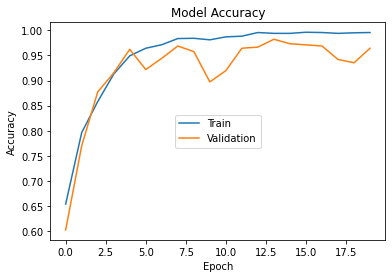

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='center')
plt.show()

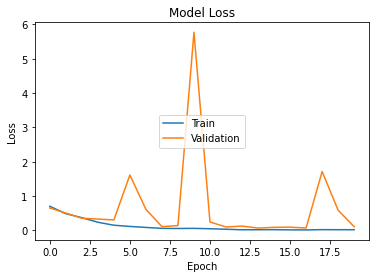

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='center')
plt.show()

#### Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
resnet_base = load_model('/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_resnet50v2.weights.best.hdf5')

#### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = resnet_base.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.9598214030265808


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = resnet_base.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = resnet_base.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 2s 123ms/step - loss: 0.1182 - accuracy: 0.9598
Final Loss: 0.11819427460432053, Final Accuracy: 0.9598214030265808
              precision    recall  f1-score   support

   Bacterial       0.95      0.96      0.96       212
     Healthy       0.97      0.96      0.96       236

    accuracy                           0.96       448
   macro avg       0.96      0.96      0.96       448
weighted avg       0.96      0.96      0.96       448



#### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat_resnet_base = resnet_base.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

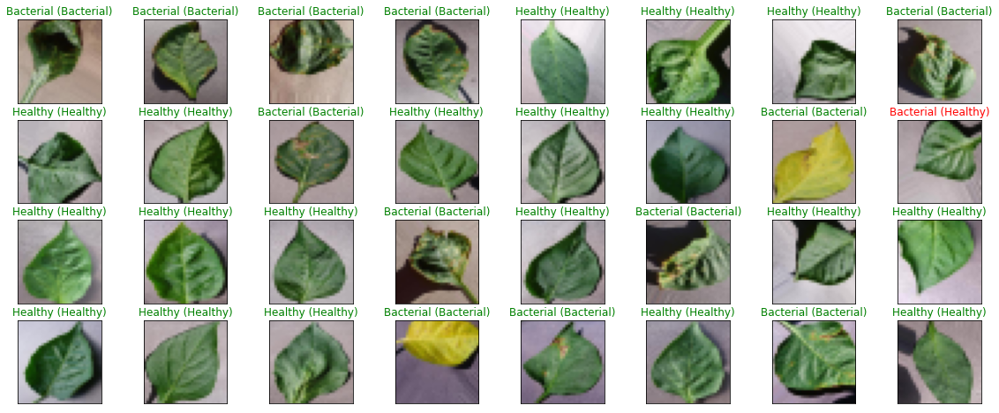

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat_resnet_base[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

#### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat_resnet_base.argmax(axis=1))
print(matrix)

[[204   8]
 [ 10 226]]


Text(0.5, 1.0, 'Confusion Matrix')

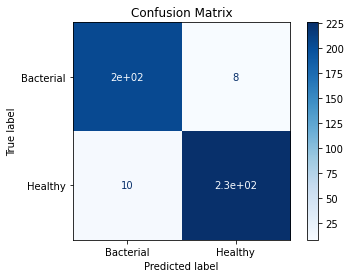

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Bacterial', 'Healthy'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

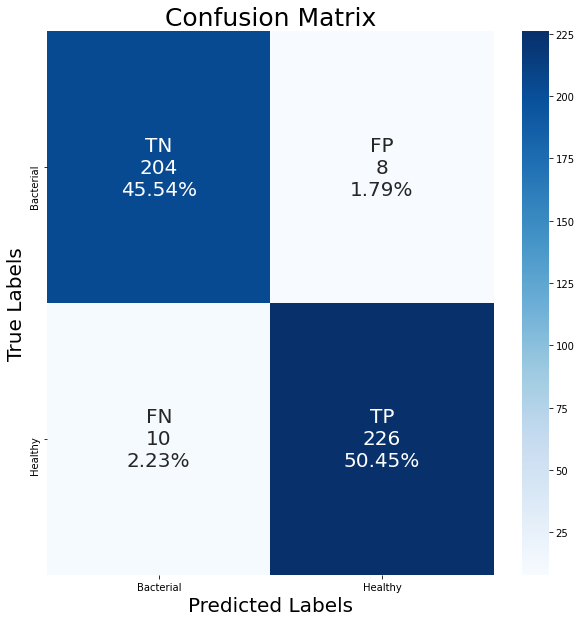

In [ ]:
import seaborn as sns

group_names = ['TN','FP','FN','TP']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)

### MobileNet

#### Model Architecture

In [ ]:
mobilenet_base = MobileNet(include_top=False, weights='imagenet', input_shape=(32,32,3))

x = mobilenet_base.output

x = GlobalAveragePooling2D()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#predict
predictions = Dense(2, activation='sigmoid')(x)

# model
mobilenet_base = Model(mobilenet_base.input, predictions)

mobilenet_base.summary()

17235968/17225924 [==============================] - 0s 0us/step
Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 16, 16, 32)        864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 16, 16, 32)        128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 16, 16, 32)        0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 16, 16, 32)        288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 16, 16, 32)        128       
____________________________________________________________

#### Compile the Model

In [ ]:
print("X_train original shape", x_train.shape)
print("y_train original shape", y_train.shape)
print("X_test original shape", x_test.shape)
print("y_test original shape", y_test.shape)

X_train original shape (3579, 32, 32, 3)
y_train original shape (3579, 2)
X_test original shape (448, 32, 32, 3)
y_test original shape (448, 2)


In [ ]:
optimizer = RMSprop(lr=0.0001)
mobilenet_base.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


#### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_mobilenet.weights.best.hdf5', verbose=1, save_best_only=True)

hist = mobilenet_base.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 54s - loss: 0.6324 - accuracy: 0.7265 - val_loss: 0.6710 - val_accuracy: 0.6451

Epoch 00001: val_loss improved from inf to 0.67105, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_mobilenet.weights.best.hdf5
Epoch 2/20
112/112 - 43s - loss: 0.3576 - accuracy: 0.8664 - val_loss: 0.5037 - val_accuracy: 0.8170

Epoch 00002: val_loss improved from 0.67105 to 0.50371, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_mobilenet.weights.best.hdf5
Epoch 3/20
112/112 - 42s - loss: 0.2535 - accuracy: 0.9056 - val_loss: 0.3010 - val_accuracy: 0.9085

Epoch 00003: val_loss improved from 0.50371 to 0.30104, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_mobilenet.weights.best.hdf5
Epoch 4/20
112/112 - 43s - loss: 0.1594 - accuracy: 0.9472 - val_loss: 0.2325 - val_accuracy: 0.9107

Epoch 00004: val_loss improved from 0.30104 to 0.23245, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_mobilenet.weights.best.hdf5
Epoch 5/20
1

In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

Waktu :  871.5216145515442  atau :  00:14:31


#### History Loss & Accuracy

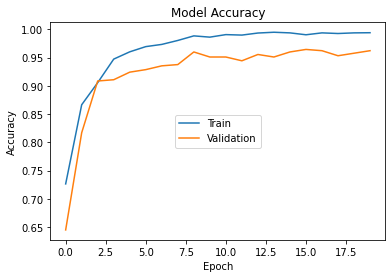

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='center')
plt.show()

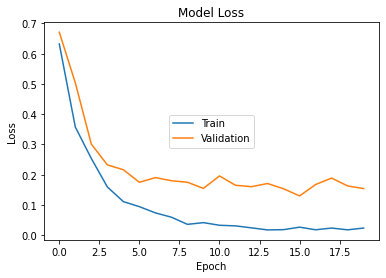

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='center')
plt.show()

#### Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
mobilenet_base = load_model('/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_mobilenet.weights.best.hdf5')

#### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = mobilenet_base.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.9464285969734192


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = mobilenet_base.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = mobilenet_base.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 0s 34ms/step - loss: 0.2058 - accuracy: 0.9464
Final Loss: 0.20582851767539978, Final Accuracy: 0.9464285969734192
              precision    recall  f1-score   support

   Bacterial       0.96      0.92      0.94       212
     Healthy       0.93      0.97      0.95       236

    accuracy                           0.95       448
   macro avg       0.95      0.95      0.95       448
weighted avg       0.95      0.95      0.95       448



#### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat_mobilenet_base = mobilenet_base.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

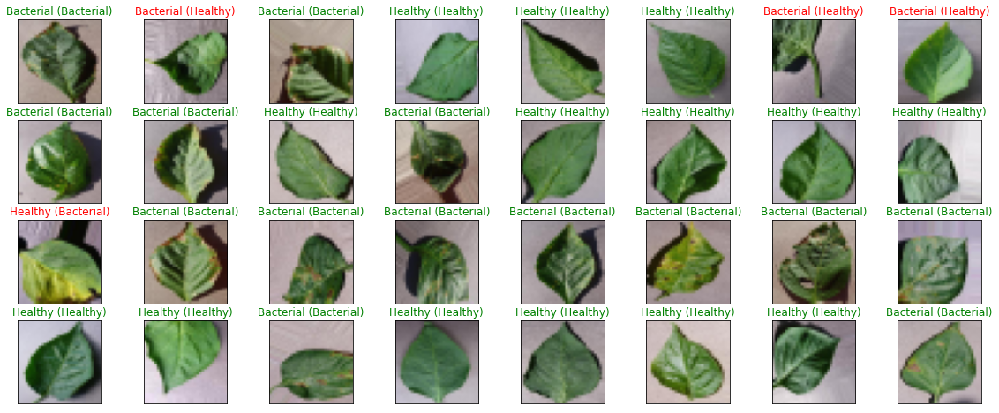

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat_mobilenet_base[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

#### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat_mobilenet_base.argmax(axis=1))
print(matrix)

[[196  16]
 [  8 228]]


Text(0.5, 1.0, 'Confusion Matrix')

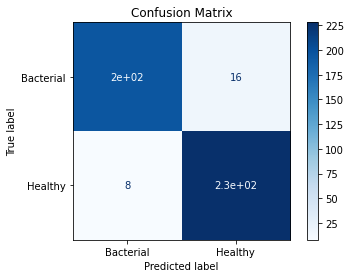

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Bacterial', 'Healthy'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

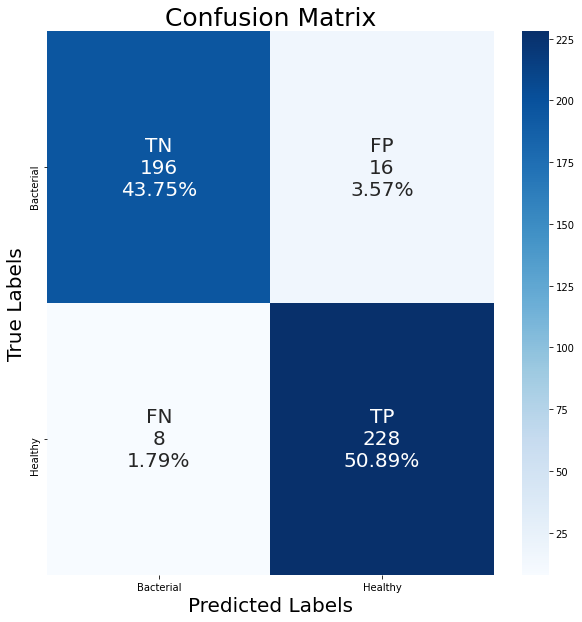

In [ ]:
import seaborn as sns

group_names = ['TN','FP','FN','TP']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)

## Select Optimizer

### Adam

#### Model Architecture

In [ ]:
model_adam = DenseNet121(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

x = model_adam.output

x = GlobalAveragePooling2D()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#predict
predictions = Dense(2, activation='sigmoid')(x)

# model
model_adam = Model(model_adam.input, predictions)

model_adam.summary()

Model: "model_21"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_22 (InputLayer)           [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d_30 (ZeroPadding2 (None, 38, 38, 3)    0           input_22[0][0]                   
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 16, 16, 64)   9408        zero_padding2d_30[0][0]          
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1/conv[0][0]                 
___________________________________________________________________________________________

#### Compile the Model

In [ ]:
optimizer = Adam(lr=0.0001)
model_adam.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


#### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='model_adam.weights.best.hdf5', verbose=1, save_best_only=True)

hist = model_adam.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 125s - loss: 0.4367 - accuracy: 0.8245 - val_loss: 0.4699 - val_accuracy: 0.7455

Epoch 00001: val_loss improved from inf to 0.46989, saving model to model1.weights.best.hdf5
Epoch 2/20
112/112 - 74s - loss: 0.1460 - accuracy: 0.9539 - val_loss: 0.1992 - val_accuracy: 0.9353

Epoch 00002: val_loss improved from 0.46989 to 0.19917, saving model to model1.weights.best.hdf5
Epoch 3/20
112/112 - 72s - loss: 0.0655 - accuracy: 0.9799 - val_loss: 0.0775 - val_accuracy: 0.9754

Epoch 00003: val_loss improved from 0.19917 to 0.07754, saving model to model1.weights.best.hdf5
Epoch 4/20
112/112 - 73s - loss: 0.0388 - accuracy: 0.9874 - val_loss: 0.0827 - val_accuracy: 0.9777

Epoch 00004: val_loss did not improve from 0.07754
Epoch 5/20
112/112 - 73s - loss: 0.0303 - accuracy: 0.9905 - val_loss: 0.0490 - val_accuracy: 0.9888

Epoch 00005: val_loss improved from 0.07754 to 0.04900, saving model to model1.weights.best.hdf5
Epoch 6/20
112/112 - 73s - loss: 0.0205 - accuracy: 0.

In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

Waktu :  1560.7258441448212  atau :  00:26:00


#### History Loss & Accuracy

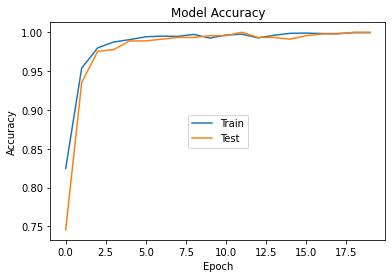

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

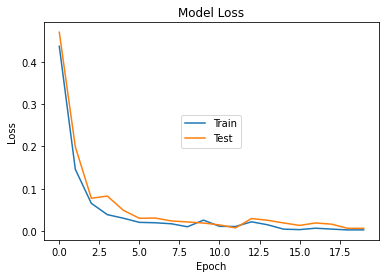

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

####  Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
model_adam = load_model('/content/model_adam.weights.best.hdf5')

In [ ]:
#2 load the weights that yielded the best validation accuracy
model_adam.load_weights('model_adam.weights.best.hdf5')

#### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = model_adam.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.9888392686843872


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = model_adam.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = model_adam.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 2s 126ms/step - loss: 0.0351 - accuracy: 0.9888
Final Loss: 0.035058021545410156, Final Accuracy: 0.9888392686843872
              precision    recall  f1-score   support

   Bacterial       1.00      0.98      0.99       212
     Healthy       0.98      1.00      0.99       236

    accuracy                           0.99       448
   macro avg       0.99      0.99      0.99       448
weighted avg       0.99      0.99      0.99       448



#### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat = model_adam.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

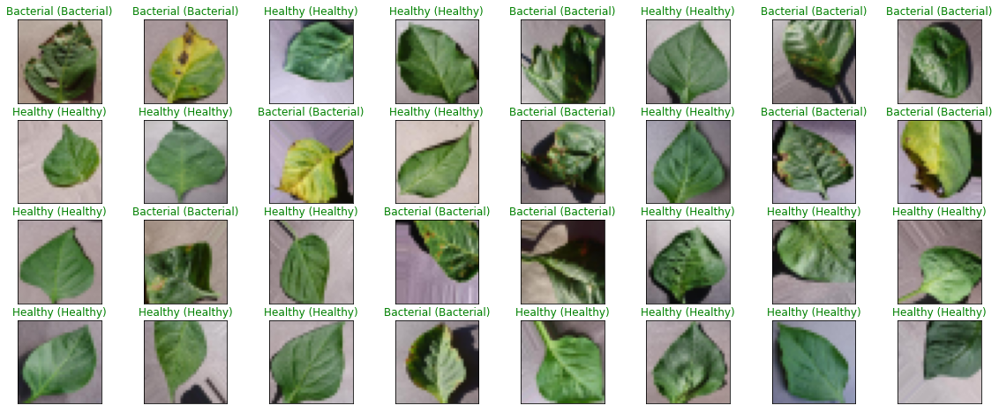

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

#### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat.argmax(axis=1))
print(matrix)

[[207   5]
 [  0 236]]


Text(0.5, 1.0, 'Confusion Matrix')

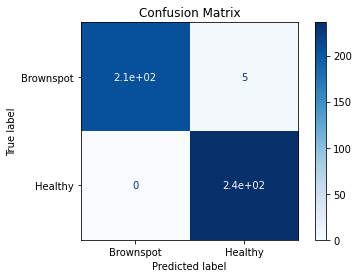

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Bacterial', 'Healthy'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

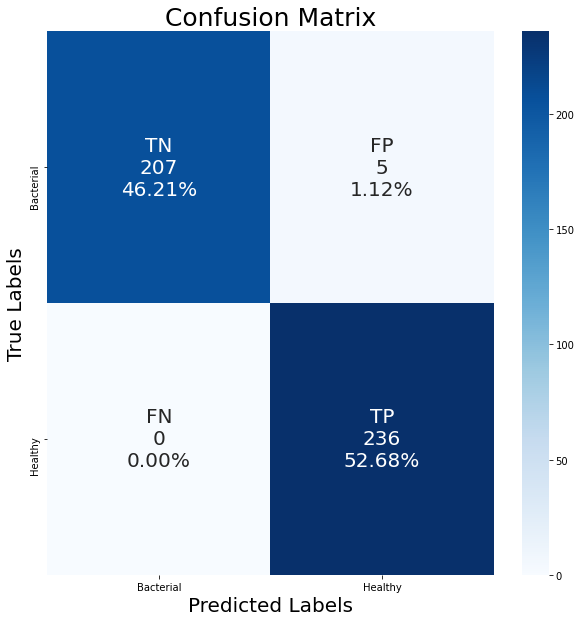

In [ ]:
import seaborn as sns

group_names = ['TN','FP','FN','TP']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)

### Adadelta

#### Model Architecture

In [ ]:
model_adadelta = DenseNet121(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

x = model_adadelta.output

x = GlobalAveragePooling2D()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#predict
predictions = Dense(2, activation='sigmoid')(x)

# model
model_adadelta = Model(model_adadelta.input, predictions)

model_adadelta.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d_10 (ZeroPadding2 (None, 38, 38, 3)    0           input_6[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 16, 16, 64)   9408        zero_padding2d_10[0][0]          
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1/conv[0][0]                 
____________________________________________________________________________________________

#### Compile the Model

In [ ]:
optimizer = Adadelta(lr=0.0001)
model_adadelta.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


#### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_adadelta.weights.best.hdf5', verbose=1, save_best_only=True)

hist = model_adadelta.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 116s - loss: 0.9550 - accuracy: 0.4878 - val_loss: 0.7731 - val_accuracy: 0.4062

Epoch 00001: val_loss improved from inf to 0.77306, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEWmodel_adadelta.weights.best.hdf5
Epoch 2/20
112/112 - 71s - loss: 0.9612 - accuracy: 0.4904 - val_loss: 0.8001 - val_accuracy: 0.4174

Epoch 00002: val_loss did not improve from 0.77306
Epoch 3/20
112/112 - 70s - loss: 0.9603 - accuracy: 0.4895 - val_loss: 0.8541 - val_accuracy: 0.4353

Epoch 00003: val_loss did not improve from 0.77306
Epoch 4/20
112/112 - 71s - loss: 0.9524 - accuracy: 0.4959 - val_loss: 0.9144 - val_accuracy: 0.4129

Epoch 00004: val_loss did not improve from 0.77306
Epoch 5/20
112/112 - 70s - loss: 0.9578 - accuracy: 0.4906 - val_loss: 0.9527 - val_accuracy: 0.4464

Epoch 00005: val_loss did not improve from 0.77306
Epoch 6/20
112/112 - 71s - loss: 0.9537 - accuracy: 0.4887 - val_loss: 0.9576 - val_accuracy: 0.4576

Epoch 00006: val_loss did not improve from 

In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

Waktu :  1497.0831518173218  atau :  00:24:57


#### History Loss & Accuracy

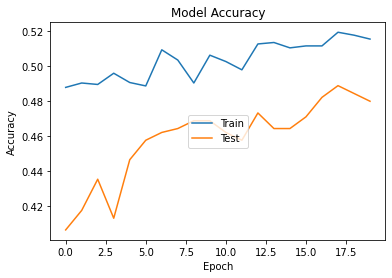

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

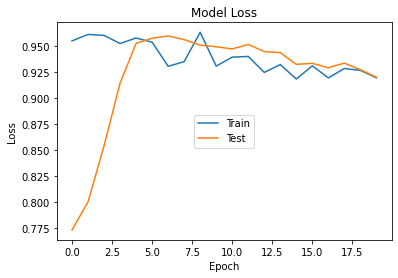

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

####  Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
model_adadelta = load_model('/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_adadelta.weights.best.hdf5')

#### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = model_adadelta.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.4263392984867096


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = model_adadelta.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = model_adadelta.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 2s 121ms/step - loss: 0.7628 - accuracy: 0.4263
Final Loss: 0.7628470063209534, Final Accuracy: 0.4263392984867096
              precision    recall  f1-score   support

   Bacterial       0.44      0.80      0.57       212
     Healthy       0.34      0.09      0.15       236

    accuracy                           0.43       448
   macro avg       0.39      0.45      0.36       448
weighted avg       0.39      0.43      0.35       448



#### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat = model_adadelta.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

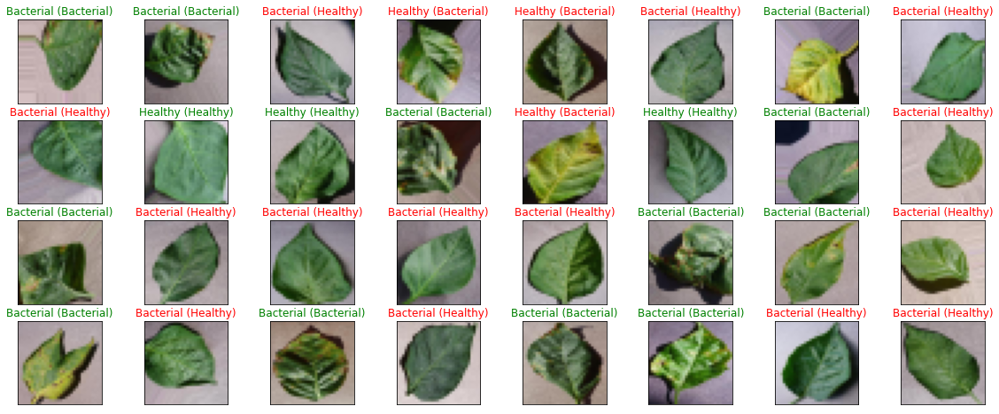

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

#### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat.argmax(axis=1))
print(matrix)

[[169  43]
 [214  22]]


Text(0.5, 1.0, 'Confusion Matrix')

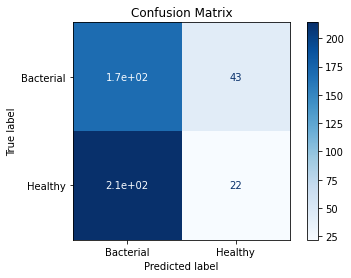

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Bacterial', 'Healthy'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

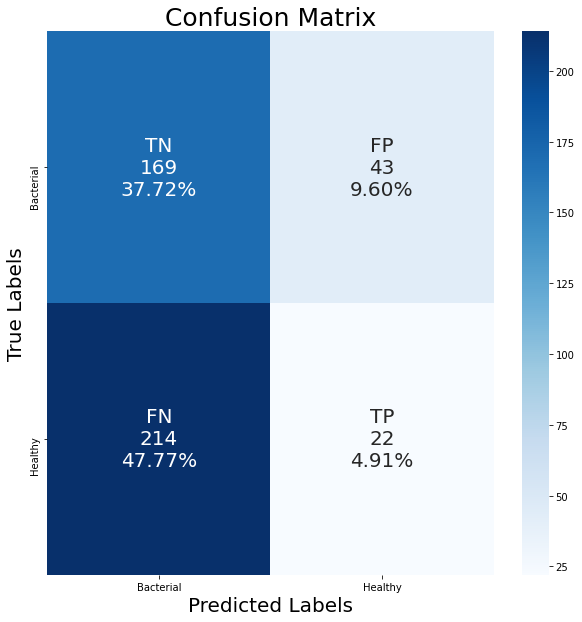

In [ ]:
import seaborn as sns

group_names = ['TN','FP','FN','TP']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)

### Adagrad

#### Model Architecture

In [ ]:
model_adagrad = DenseNet121(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

x = model_adagrad.output

x = GlobalAveragePooling2D()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#predict
predictions = Dense(2, activation='sigmoid')(x)

# model
model_adagrad = Model(model_adagrad.input, predictions)

model_adagrad.summary()

Model: "model_23"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_24 (InputLayer)           [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d_34 (ZeroPadding2 (None, 38, 38, 3)    0           input_24[0][0]                   
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 16, 16, 64)   9408        zero_padding2d_34[0][0]          
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1/conv[0][0]                 
___________________________________________________________________________________________

#### Compile the Model

In [ ]:
optimizer = Adagrad(lr=0.0001)
model_adagrad.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


#### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_adagrad.weights.best.hdf5', verbose=1, save_best_only=True)

hist = model_adagrad.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 117s - loss: 0.9246 - accuracy: 0.5384 - val_loss: 0.6579 - val_accuracy: 0.6317

Epoch 00001: val_loss improved from inf to 0.65790, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_adagrad.weights.best.hdf5
Epoch 2/20
112/112 - 70s - loss: 0.8031 - accuracy: 0.6164 - val_loss: 0.6663 - val_accuracy: 0.6540

Epoch 00002: val_loss did not improve from 0.65790
Epoch 3/20
112/112 - 69s - loss: 0.7100 - accuracy: 0.6843 - val_loss: 0.6461 - val_accuracy: 0.6897

Epoch 00003: val_loss improved from 0.65790 to 0.64611, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_adagrad.weights.best.hdf5
Epoch 4/20
112/112 - 69s - loss: 0.6656 - accuracy: 0.7178 - val_loss: 0.6185 - val_accuracy: 0.7232

Epoch 00004: val_loss improved from 0.64611 to 0.61854, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_adagrad.weights.best.hdf5
Epoch 5/20
112/112 - 68s - loss: 0.6140 - accuracy: 0.7457 - val_loss: 0.6175 - val_accuracy: 0.7433

Epoch 0000

In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

Waktu :  1497.3213744163513  atau :  00:24:57


#### History Loss & Accuracy

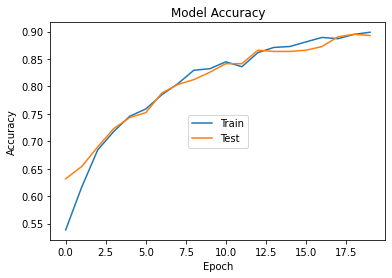

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

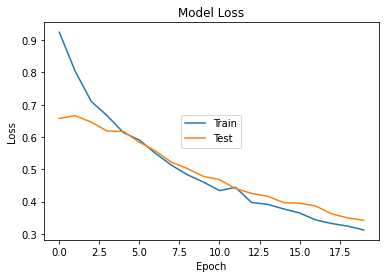

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

####  Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
model_adagrad = load_model('/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_adagrad.weights.best.hdf5')

In [ ]:
#2 load the weights that yielded the best validation accuracy
model_adagrad.load_weights('model_adagrad.weights.best.hdf5')

#### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = model_adagrad.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.875


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = model_adagrad.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = model_adagrad.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 2s 121ms/step - loss: 0.3432 - accuracy: 0.8750
Final Loss: 0.343182235956192, Final Accuracy: 0.875
              precision    recall  f1-score   support

   Bacterial       0.89      0.84      0.86       212
     Healthy       0.87      0.90      0.88       236

    accuracy                           0.88       448
   macro avg       0.88      0.87      0.87       448
weighted avg       0.88      0.88      0.87       448



#### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat = model_adagrad.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

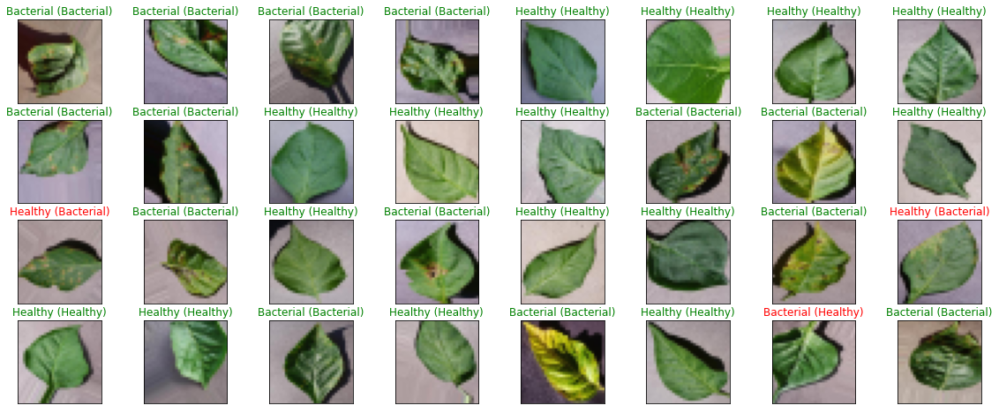

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

#### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat.argmax(axis=1))
print(matrix)

[[179  33]
 [ 23 213]]


Text(0.5, 1.0, 'Confusion Matrix')

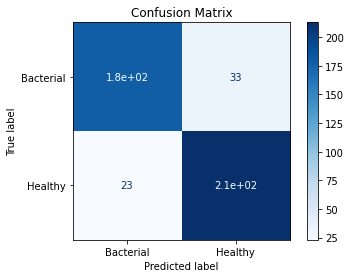

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Bacterial', 'Healthy'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

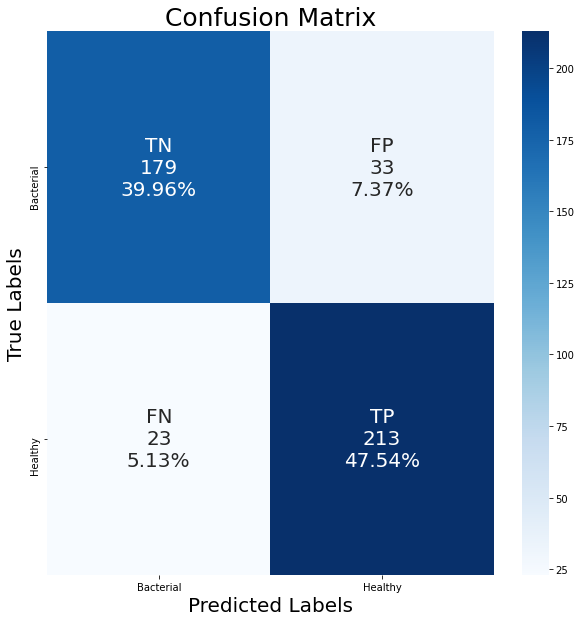

In [ ]:
import seaborn as sns

group_names = ['TN','FP','FN','TP']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)

### RMSprop

#### Model Architecture

In [ ]:
model_rmsprop = DenseNet121(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

x = model_rmsprop.output

x = GlobalAveragePooling2D()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#predict
predictions = Dense(2, activation='sigmoid')(x)

# model
model_rmsprop = Model(model_rmsprop.input, predictions)

model_rmsprop.summary()

Model: "model_25"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_26 (InputLayer)           [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d_38 (ZeroPadding2 (None, 38, 38, 3)    0           input_26[0][0]                   
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 16, 16, 64)   9408        zero_padding2d_38[0][0]          
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1/conv[0][0]                 
___________________________________________________________________________________________

#### Compile the Model

In [ ]:
optimizer = RMSprop(lr=0.0001)
model_rmsprop.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


#### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_rmsprop.weights.best.hdf5', verbose=1, save_best_only=True)

hist = model_rmsprop.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 126s - loss: 0.3800 - accuracy: 0.8502 - val_loss: 0.5441 - val_accuracy: 0.6964

Epoch 00001: val_loss improved from inf to 0.54405, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_rmsprop.weights.best.hdf5
Epoch 2/20
112/112 - 72s - loss: 0.1190 - accuracy: 0.9589 - val_loss: 0.2396 - val_accuracy: 0.9129

Epoch 00002: val_loss improved from 0.54405 to 0.23958, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_rmsprop.weights.best.hdf5
Epoch 3/20
112/112 - 72s - loss: 0.0557 - accuracy: 0.9816 - val_loss: 0.1131 - val_accuracy: 0.9531

Epoch 00003: val_loss improved from 0.23958 to 0.11311, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_rmsprop.weights.best.hdf5
Epoch 4/20
112/112 - 72s - loss: 0.0312 - accuracy: 0.9902 - val_loss: 0.0475 - val_accuracy: 0.9844

Epoch 00004: val_loss improved from 0.11311 to 0.04753, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_rmsprop.weights.best.hdf5
Epoch 5/20
112/112 

In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

Waktu :  1565.2229793071747  atau :  00:26:05


#### History Loss & Accuracy

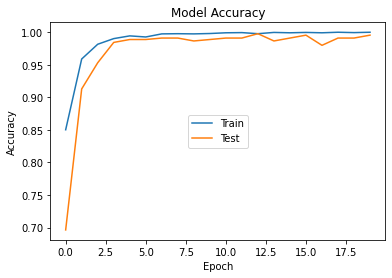

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

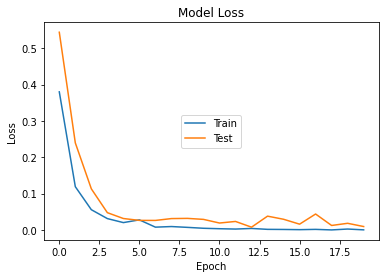

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

####  Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
model_rmsprop = load_model('/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_rmsprop.weights.best.hdf5')

In [ ]:
#2 load the weights that yielded the best validation accuracy
model_rmsprop.load_weights('model_rmsprop.weights.best.hdf5')

#### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = model_rmsprop.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.9933035969734192


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = model_rmsprop.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = model_rmsprop.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 2s 124ms/step - loss: 0.0144 - accuracy: 0.9933
Final Loss: 0.014434651471674442, Final Accuracy: 0.9933035969734192
              precision    recall  f1-score   support

   Bacterial       0.99      1.00      0.99       212
     Healthy       1.00      0.99      0.99       236

    accuracy                           0.99       448
   macro avg       0.99      0.99      0.99       448
weighted avg       0.99      0.99      0.99       448



#### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat = model_rmsprop.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

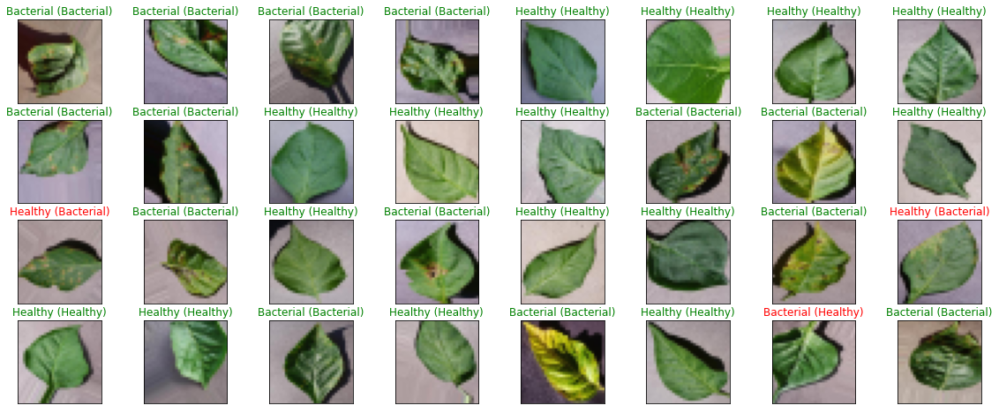

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

#### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat.argmax(axis=1))
print(matrix)

[[212   0]
 [  3 233]]


Text(0.5, 1.0, 'Confusion Matrix')

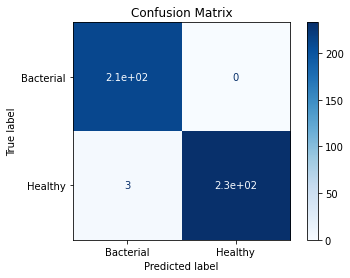

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Bacterial', 'Healthy'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

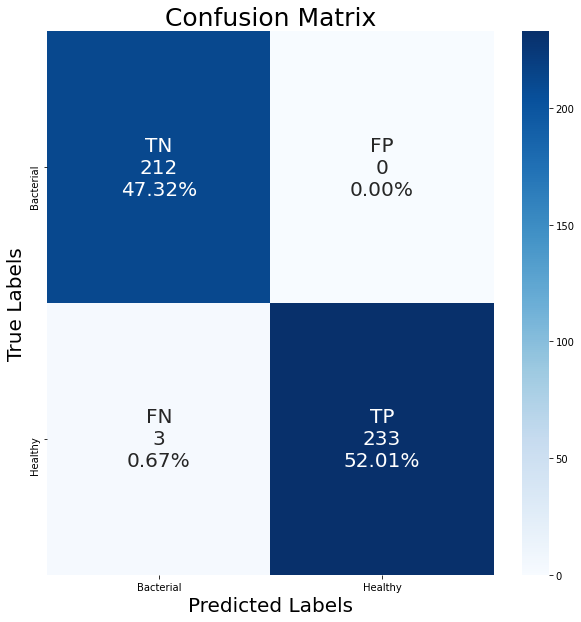

In [ ]:
import seaborn as sns

group_names = ['TN','FP','FN','TP']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)

### SGD

#### Model Architecture

In [ ]:
model_sgd = DenseNet121(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

x = model_sgd.output

x = GlobalAveragePooling2D()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#predict
predictions = Dense(2, activation='sigmoid')(x)

# model
model_sgd = Model(model_sgd.input, predictions)

model_sgd.summary()

Model: "model_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d_8 (ZeroPadding2D (None, 38, 38, 3)    0           input_8[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 16, 16, 64)   9408        zero_padding2d_8[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1/conv[0][0]                 
____________________________________________________________________________________________

#### Compile the Model

In [ ]:
optimizer = SGD(lr=0.0001)
model_sgd.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


#### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_sgd.weights.best.hdf5', verbose=1, save_best_only=True)

hist = model_sgd.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 110s - loss: 0.9405 - accuracy: 0.5166 - val_loss: 0.6711 - val_accuracy: 0.6451

Epoch 00001: val_loss improved from inf to 0.67105, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_sgd.weights.best.hdf5
Epoch 2/20
112/112 - 67s - loss: 0.8555 - accuracy: 0.5742 - val_loss: 0.7323 - val_accuracy: 0.5290

Epoch 00002: val_loss did not improve from 0.67105
Epoch 3/20
112/112 - 67s - loss: 0.7928 - accuracy: 0.6178 - val_loss: 0.7187 - val_accuracy: 0.5826

Epoch 00003: val_loss did not improve from 0.67105
Epoch 4/20
112/112 - 67s - loss: 0.7596 - accuracy: 0.6348 - val_loss: 0.6699 - val_accuracy: 0.6652

Epoch 00004: val_loss improved from 0.67105 to 0.66990, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_sgd.weights.best.hdf5
Epoch 5/20
112/112 - 67s - loss: 0.6989 - accuracy: 0.6784 - val_loss: 0.6364 - val_accuracy: 0.7121

Epoch 00005: val_loss improved from 0.66990 to 0.63644, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW

In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

Waktu :  1434.4510235786438  atau :  00:23:54


#### History Loss & Accuracy

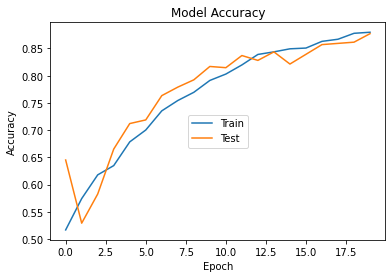

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

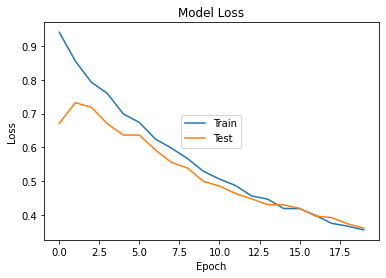

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

####  Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
model_sgd = load_model('/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_sgd.weights.best.hdf5')

In [ ]:
#2 load the weights that yielded the best validation accuracy
model_sgd.load_weights('model_sgd.weights.best.hdf5')

#### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = model_sgd.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.8660714030265808


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = model_sgd.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = model_sgd.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 2s 121ms/step - loss: 0.3829 - accuracy: 0.8661
Final Loss: 0.38293153047561646, Final Accuracy: 0.8660714030265808
              precision    recall  f1-score   support

   Bacterial       0.86      0.86      0.86       212
     Healthy       0.88      0.87      0.87       236

    accuracy                           0.87       448
   macro avg       0.87      0.87      0.87       448
weighted avg       0.87      0.87      0.87       448



#### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat = model_sgd.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

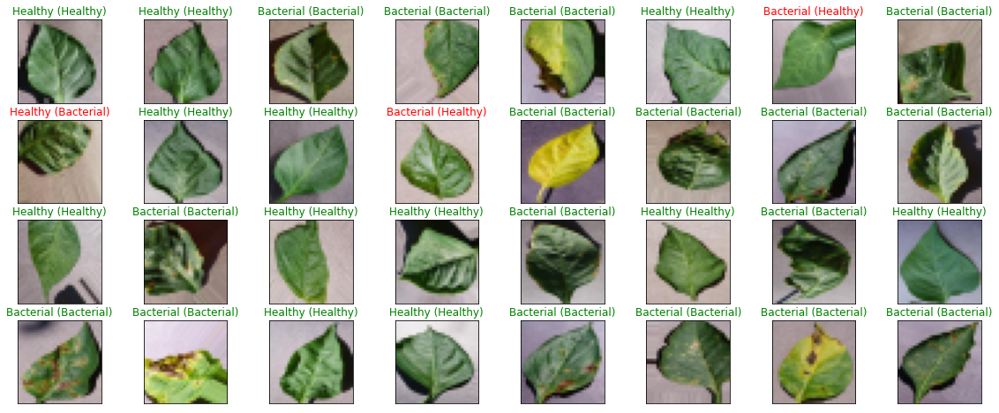

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

#### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat.argmax(axis=1))
print(matrix)

[[183  29]
 [ 31 205]]


Text(0.5, 1.0, 'Confusion Matrix')

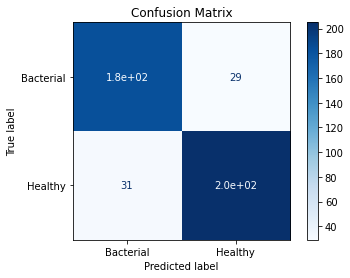

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Bacterial', 'Healthy'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

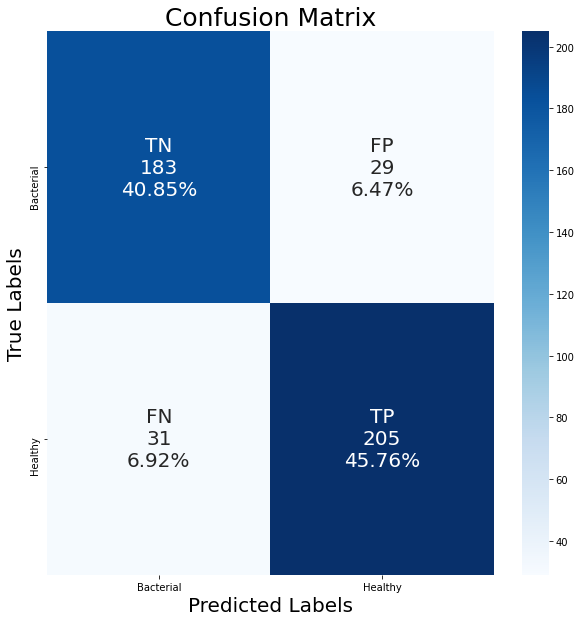

In [ ]:
import seaborn as sns

group_names = ['TN','FP','FN','TP']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)

## Test Dropout

### Without Dropout

#### Model Architecture

In [ ]:
without_dropout = DenseNet121(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

x = without_dropout.output

x = GlobalAveragePooling2D()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
# x= Dropout(0.3)(x)

#predict
predictions = Dense(2, activation='sigmoid')(x)

# model
without_dropout = Model(without_dropout.input, predictions)

without_dropout.summary()

29097984/29084464 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 38, 38, 3)    0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 16, 16, 64)   9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1/conv[0][0]                 
_____________________________

#### Compile the Model

In [ ]:
optimizer = RMSprop(lr=0.0001)
without_dropout.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


#### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='/content/drive/MyDrive/Kaggle2/HDF5/NEW/without_dropout.weights.best.hdf5', verbose=1, save_best_only=True)

hist = without_dropout.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 145s - loss: 0.3250 - accuracy: 0.8670 - val_loss: 0.4486 - val_accuracy: 0.7478

Epoch 00001: val_loss improved from inf to 0.44863, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/without_dropout.weights.best.hdf5
Epoch 2/20
112/112 - 73s - loss: 0.0953 - accuracy: 0.9673 - val_loss: 0.2492 - val_accuracy: 0.8728

Epoch 00002: val_loss improved from 0.44863 to 0.24921, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/without_dropout.weights.best.hdf5
Epoch 3/20
112/112 - 72s - loss: 0.0528 - accuracy: 0.9816 - val_loss: 0.0844 - val_accuracy: 0.9665

Epoch 00003: val_loss improved from 0.24921 to 0.08435, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/without_dropout.weights.best.hdf5
Epoch 4/20
112/112 - 73s - loss: 0.0341 - accuracy: 0.9877 - val_loss: 0.0413 - val_accuracy: 0.9754

Epoch 00004: val_loss improved from 0.08435 to 0.04129, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/without_dropout.weights.best.hdf5
Epoch 5/20


In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

Waktu :  1584.5370907783508  atau :  00:26:24


#### History Loss & Accuracy

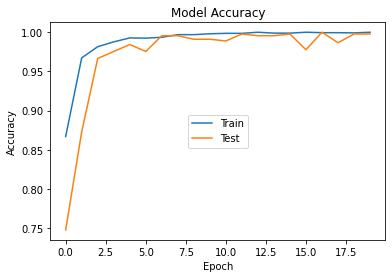

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

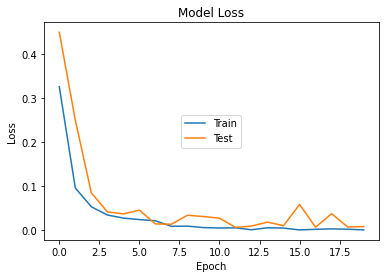

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

####  Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
without_dropout = load_model('/content/drive/MyDrive/Kaggle2/HDF5/NEW/without_dropout.weights.best.hdf5')

In [ ]:
#2 load the weights that yielded the best validation accuracy
without_dropout.load_weights('without_dropout.weights.best.hdf5')

#### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = without_dropout.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.9866071343421936


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = without_dropout.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = without_dropout.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 2s 158ms/step - loss: 0.0554 - accuracy: 0.9866
Final Loss: 0.0554305836558342, Final Accuracy: 0.9866071343421936
              precision    recall  f1-score   support

   Bacterial       0.99      0.99      0.99       212
     Healthy       0.99      0.99      0.99       236

    accuracy                           0.99       448
   macro avg       0.99      0.99      0.99       448
weighted avg       0.99      0.99      0.99       448



#### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat = without_dropout.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

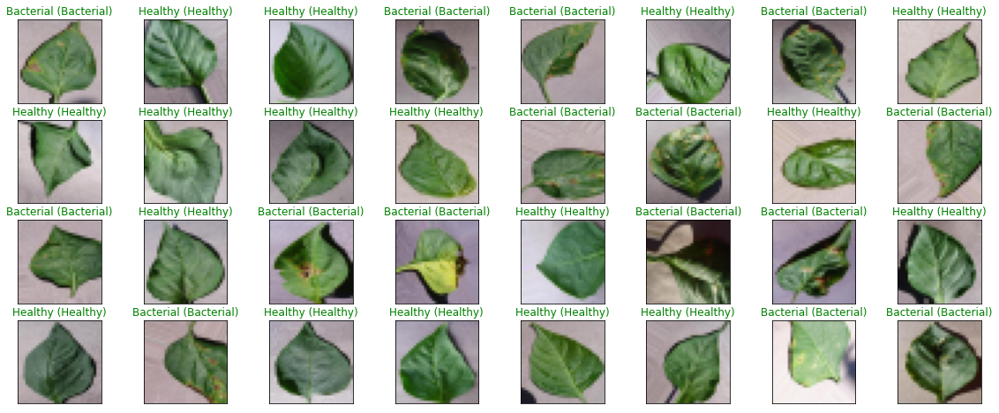

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

#### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat.argmax(axis=1))
print(matrix)

[[209   3]
 [  3 233]]


Text(0.5, 1.0, 'Confusion Matrix')

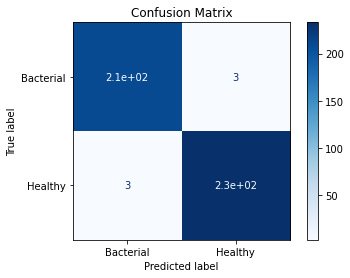

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Bacterial', 'Healthy'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

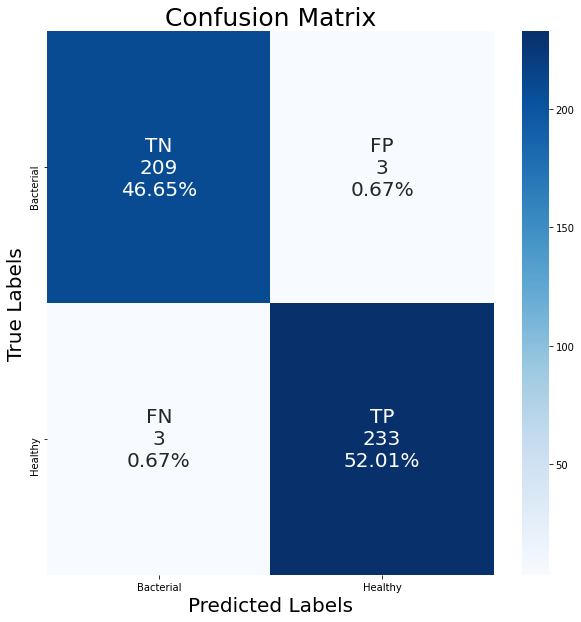

In [ ]:
import seaborn as sns

group_names = ['TN','FP','FN','TP']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)

### Change Dropout

#### Model Architecture

In [ ]:
change_dropout = DenseNet121(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

x = change_dropout.output

x = GlobalAveragePooling2D()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.2)(x)

#predict
predictions = Dense(2, activation='sigmoid')(x)

# model
change_dropout = Model(change_dropout.input, predictions)

change_dropout.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d_6 (ZeroPadding2D (None, 38, 38, 3)    0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 16, 16, 64)   9408        zero_padding2d_6[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1/conv[0][0]                 
____________________________________________________________________________________________

#### Compile the Model

In [ ]:
optimizer = RMSprop(lr=0.0001)
change_dropout.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


#### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='/content/drive/MyDrive/Kaggle2/HDF5/NEW/change_dropout.weights.best.hdf5', verbose=1, save_best_only=True)

hist = change_dropout.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 126s - loss: 0.3586 - accuracy: 0.8648 - val_loss: 0.3484 - val_accuracy: 0.8348

Epoch 00001: val_loss improved from inf to 0.34837, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/change_dropout.weights.best.hdf5
Epoch 2/20
112/112 - 72s - loss: 0.1052 - accuracy: 0.9668 - val_loss: 0.1630 - val_accuracy: 0.9375

Epoch 00002: val_loss improved from 0.34837 to 0.16298, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/change_dropout.weights.best.hdf5
Epoch 3/20
112/112 - 72s - loss: 0.0510 - accuracy: 0.9841 - val_loss: 0.0590 - val_accuracy: 0.9821

Epoch 00003: val_loss improved from 0.16298 to 0.05898, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/change_dropout.weights.best.hdf5
Epoch 4/20
112/112 - 72s - loss: 0.0272 - accuracy: 0.9911 - val_loss: 0.0365 - val_accuracy: 0.9844

Epoch 00004: val_loss improved from 0.05898 to 0.03652, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/change_dropout.weights.best.hdf5
Epoch 5/20
112/

In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

NameError: ignored

#### History Loss & Accuracy

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

####  Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
change_dropout = load_model('/content/drive/MyDrive/Kaggle2/HDF5/NEW/change_dropout.weights.best.hdf5')

In [ ]:
#2 load the weights that yielded the best validation accuracy
change_dropout.load_weights('change_dropout.weights.best.hdf5')

#### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = change_dropout.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.9888392686843872


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = change_dropout.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = change_dropout.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 2s 127ms/step - loss: 0.0129 - accuracy: 0.9955
Final Loss: 0.01285085640847683, Final Accuracy: 0.9955357313156128
              precision    recall  f1-score   support

   Bacterial       1.00      1.00      1.00       212
     Healthy       1.00      1.00      1.00       236

    accuracy                           1.00       448
   macro avg       1.00      1.00      1.00       448
weighted avg       1.00      1.00      1.00       448



#### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat = change_dropout.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

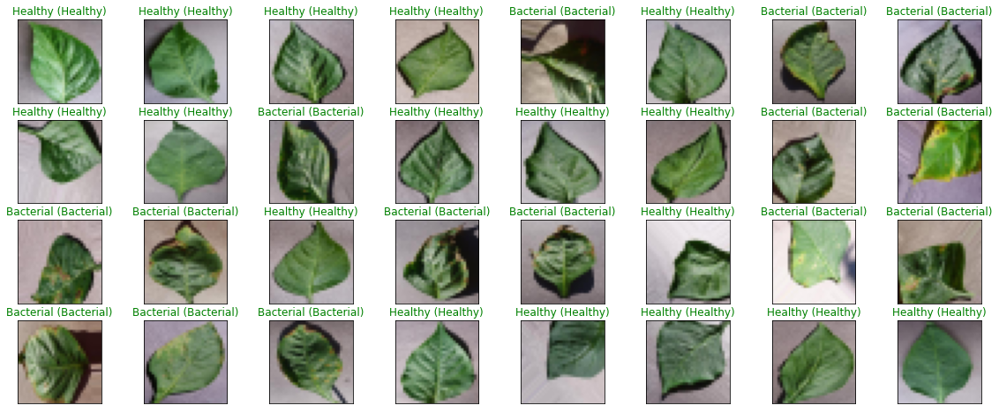

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

#### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat.argmax(axis=1))
print(matrix)

[[211   1]
 [  1 235]]


Text(0.5, 1.0, 'Confusion Matrix')

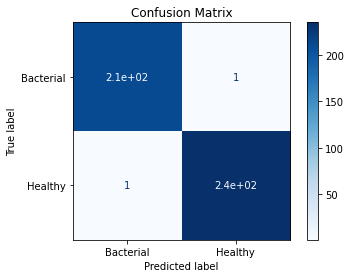

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Bacterial', 'Healthy'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

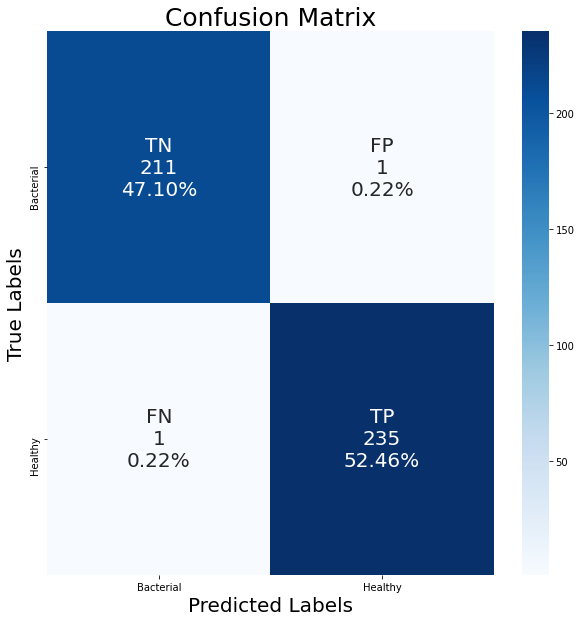

In [ ]:
import seaborn as sns

group_names = ['TN','FP','FN','TP']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)

## Percobaan Tanpa Fine-Tuning

#### Model Architecture

In [ ]:
nonfinetuning = DenseNet121(weights='imagenet', include_top=False, input_shape=(32, 32, 3))
for layer in nonfinetuning.layers:
    layer.trainable = False

x = nonfinetuning.output

# x = GlobalAveragePooling2D()(x)
x = Flatten()(x)

#layer 1
x= Dense(1024,activation='relu')(x)
x= BatchNormalization()(x)
x= Dropout(0.3)(x)

#predict
predictions = Dense(2, activation='sigmoid')(x)

# model
nonfinetuning = Model(nonfinetuning.input, predictions)

nonfinetuning.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d_4 (ZeroPadding2D (None, 38, 38, 3)    0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 16, 16, 64)   9408        zero_padding2d_4[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1/conv[0][0]                 
____________________________________________________________________________________________

#### Compile the Model

In [ ]:
optimizer = RMSprop(lr=0.0001)
nonfinetuning.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


#### Train the Model

In [ ]:
import time
from keras.callbacks import ModelCheckpoint

#start time
start = time.time()

# train the model
checkpointer = ModelCheckpoint(filepath='/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_nonTL.weights.best.hdf5', verbose=1, save_best_only=True)

hist = nonfinetuning.fit(x_train, y_train, batch_size=32, epochs=20,
          validation_data=(x_valid, y_valid), callbacks=[checkpointer],
          verbose=2, shuffle=True)

Epoch 1/20
112/112 - 23s - loss: 0.4345 - accuracy: 0.8262 - val_loss: 0.3392 - val_accuracy: 0.8549

Epoch 00001: val_loss improved from inf to 0.33923, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_nonTL.weights.best.hdf5
Epoch 2/20
112/112 - 15s - loss: 0.2558 - accuracy: 0.9072 - val_loss: 0.2645 - val_accuracy: 0.8906

Epoch 00002: val_loss improved from 0.33923 to 0.26447, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_nonTL.weights.best.hdf5
Epoch 3/20
112/112 - 15s - loss: 0.2098 - accuracy: 0.9260 - val_loss: 0.2082 - val_accuracy: 0.9263

Epoch 00003: val_loss improved from 0.26447 to 0.20815, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_nonTL.weights.best.hdf5
Epoch 4/20
112/112 - 15s - loss: 0.1674 - accuracy: 0.9424 - val_loss: 0.1952 - val_accuracy: 0.9196

Epoch 00004: val_loss improved from 0.20815 to 0.19516, saving model to /content/drive/MyDrive/Kaggle2/HDF5/NEW/model_nonTL.weights.best.hdf5
Epoch 5/20
112/112 - 15s - l

In [ ]:
#end time
end = time.time()
finish_second = end - start
finish_minute = time.strftime("%H:%M:%S", time.gmtime(finish_second))

print('Waktu : ', finish_second, ' atau : ', finish_minute)

Waktu :  328.1964387893677  atau :  00:05:28


#### History Loss & Accuracy

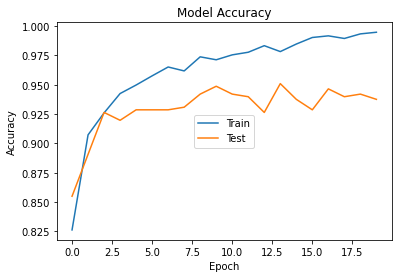

In [ ]:
# accuracy plot
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

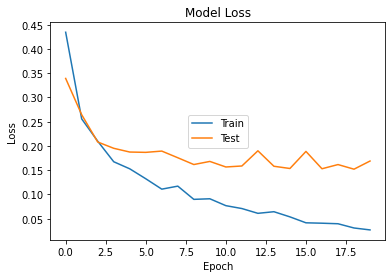

In [ ]:
# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='center')
plt.show()

####  Load the Model with the Best Validation Accuracy

In [ ]:
#1 Load the Model from Google Drive
from keras.models import load_model
nonfinetuning = load_model('/content/drive/MyDrive/Kaggle2/HDF5/NEW/model_nonTL.weights.best.hdf5')

In [ ]:
#2 load the weights that yielded the best validation accuracy
nonfinetuning.load_weights('model1.weights.best.hdf5')

#### Calculate Classification Accuracy on Test Set

In [ ]:
# evaluate and print test accuracy
score = nonfinetuning.evaluate(x_test, y_test, verbose=0)
print('\n', 'Test accuracy:', score[1])


 Test accuracy: 0.9196428656578064


In [ ]:
disease_types = ['Bacterial', 'Healthy']

final_loss, final_accuracy = nonfinetuning.evaluate(x_test, y_test)
from sklearn.metrics import classification_report
y_pred = nonfinetuning.predict(x_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))
print(classification_report(y_true, y_pred, target_names=disease_types))

14/14 [==============================] - 2s 122ms/step - loss: 0.1825 - accuracy: 0.9353
Final Loss: 0.18253758549690247, Final Accuracy: 0.9352678656578064
              precision    recall  f1-score   support

   Bacterial       0.94      0.92      0.93       212
     Healthy       0.93      0.94      0.94       236

    accuracy                           0.94       448
   macro avg       0.94      0.93      0.94       448
weighted avg       0.94      0.94      0.94       448



In [ ]:
# Kappa Statistic
from sklearn.metrics import cohen_kappa_score
result=cohen_kappa_score(y_true, y_pred)
print("Kappa statistic = {}".format(result))

Kappa statistic = 0.8700696055684455


#### Visualize Some Predictions

This may give you some insight into why the network is misclassifying certain objects.

In [ ]:
# get predictions on the test set
y_hat = nonfinetuning.predict(x_test)

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
archive = ['Bacterial', 'Healthy']

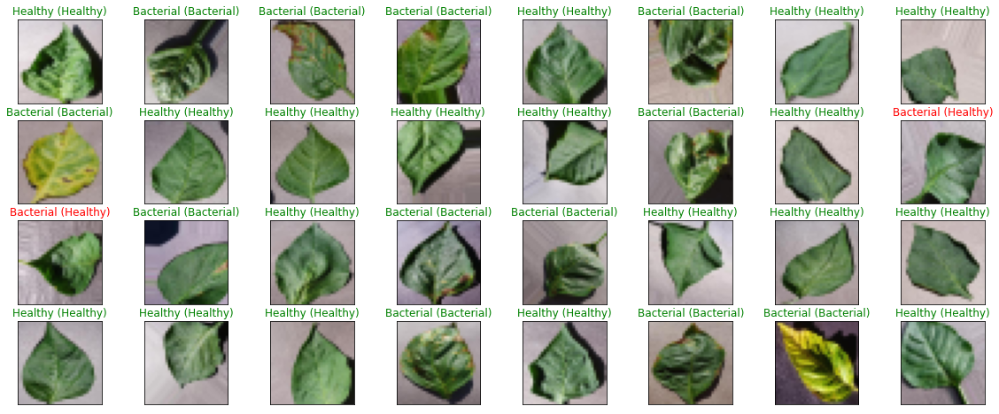

In [ ]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=32, replace=False)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(archive[pred_idx], archive[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

#### Show the Confusion Matrix

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

# get the confusion matrix
matrix = confusion_matrix(y_test.argmax(axis=1), y_hat.argmax(axis=1))
print(matrix)

[[196  16]
 [ 13 223]]


Text(0.5, 1.0, 'Confusion Matrix')

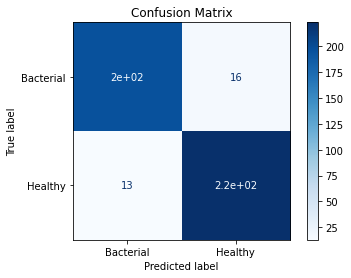

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cmd = ConfusionMatrixDisplay(matrix, display_labels=['Bacterial', 'Healthy'])
cmd.plot(cmap = plt.cm.Blues)
plt.title('Confusion Matrix')

Text(0.5, 1.0, 'Confusion Matrix')

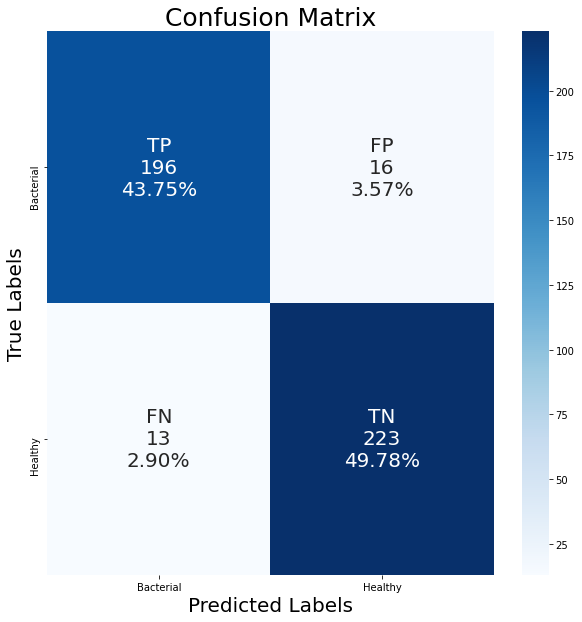

In [ ]:
import seaborn as sns

group_names = ['TP','FP','FN','TN']
group_counts = ['{0:0.0f}'.format(value) for value in matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in matrix.flatten()/np.sum(matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(matrix, xticklabels=disease_types, yticklabels=disease_types, ax=ax, annot=labels, fmt='', cbar=True, annot_kws={'size': 20}, cmap='Blues')
ax.set_xlabel('Predicted Labels', fontsize=20)
ax.set_ylabel('True Labels', fontsize=20)
plt.title('Confusion Matrix', fontsize=25)